<!--start-block-->
<hr style="height: 1px;">
<i>This code was authored by the 8.316 Course Team, Copyright 2023 MIT All Rights Reserved.</i>
<hr style="height: 1px;">
<br>

# LECTURE 17: Planetary Dynamics Follow up



<a name='section_17_0'></a>
<hr style="height: 1px;">


## <h2 style="border:1px; border-style:solid; padding: 0.25em; color: #FFFFFF; background-color: #90409C">L17.0 Overview of Learning Objectives</h2>


Like what we saw for the pendulum, there are a broad range of techniques that can be used to numerically solve differential equations. Most numerical physics courses are taught by people who do a lot of this simulation, and as such like to dwell on the immense amount of work that has happened in the past 50 years.

A lot of this work is built on a huge amount of trial and error with the successes and failures having names after the people who did them. This makes it a bit hard to follow for someone like myself who doesn't know these people. However, much of this trial and error can be consolidated into some broad physics concepts that we can teach without trying and failing as many times. 

In this lecture we are going to build up the Hamiltonian Monte-Carlo Methods that are used for n-body  simulations. This part of this course wil just touch on the main elements. However, there is rich literature associated with this effort. We will dicuss this later. 


In [1]:
import imageio
from PIL import Image

import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt

import matplotlib.pyplot as plt
import numpy as np
from scipy.integrate import odeint
from scipy.optimize import minimize
import csv
from matplotlib.patches import Circle
from scipy.integrate import solve_ivp
#nbody
#https://courses.physics.ucsd.edu/2019/Winter/physics141/Lectures/Lecture14/renaud_thesis.pdf
#https://www.tat.physik.uni-tuebingen.de/~schaefer/teach/fum2020/f/nbody_slides.pdf
#https://github.com/bacook17/behalf/blob/master/behalf/octree.py
#https://anaroxanapop.github.io/behalf/#Code

<h3>Setting Default Figure Parameters</h3>

The following code cell sets default values for figure parameters.


In [2]:
#>>>RUN: L10.0-runcell02

#set plot resolution
%config InlineBackend.figure_format = 'retina'

#set default figure parameters
plt.rcParams['figure.figsize'] = (9,6)

medium_size = 12
large_size = 15

plt.rc('font', size=medium_size)          # default text sizes
plt.rc('xtick', labelsize=medium_size)    # xtick labels
plt.rc('ytick', labelsize=medium_size)    # ytick labels
plt.rc('legend', fontsize=medium_size)    # legend
plt.rc('axes', titlesize=large_size)      # axes title
plt.rc('axes', labelsize=large_size)      # x and y labels
plt.rc('figure', titlesize=large_size)    # figure title

<a name='section_16_5'></a>
<hr style="height: 1px;">

## <h2 style="border:1px; border-style:solid; padding: 0.25em; color: #FFFFFF; background-color: #90409C">L16.5 ML N-body Problem </h2>  


Now, we are going to construct a very simple machine learning approach to stellar simulation. While, this approach will not really allow us to go into detail, we will start to grasp a concept of where machine learning is relevant in a simulation scenario. 

To this, we first need to pull in our usual simulation code dictating stellar evolution. We will be sure to use the leapfrog symplectic integrator. Additionally, we will use a fixed time-step. 

Ok, so looks ok; could be better, but thats beyond this class. 

Now there is a broad range of possibilities that we can consier machine learning for. Ideally, we would want to use the fact that machine learning allows us to do a function approximation, but very fast and effectively. For the use of this in simulation, we can do just that, a funcitonal approximation. 

Now, lets consider the situation where we have randomly sample some initial conditions and then compute a tractory for that, then from that try to predict something. 

To randomly sample, we are going to have same over a restricted phase space. The issue is that a full random sample of many parametes is just hard to simulate, we are trying to predict a broad range of final states, this is tricky.

So for this sampling, what we will do is restrict our possible cases. We are going to restrict to a some simplified case where things are easy to solve. 


In [77]:
##So now we are going to write a script that generates 1000 random conditions and trains a neural network to predict then ext 30 time steps
##We are going to do this for 2 body to start with
##To keep the dimensionality down to something reasonable, we are going to do this in the COM frame

def randomSamplePlanets(iN=2):
    ###Lets simplify the coordinates
    ###sample a radius along the x-axis 
    #radius=np.ones(iN)
    #radius[0]=-1    
    radius=np.random.uniform(0.5,2,iN)#units of AU
    radius[1]=-radius[0]
    #theta=np.random.uniform(0,2.*np.pi,iN)    
    #merge positions and make sure each row is planet
    theta=0
    pos=np.vstack((radius*np.cos(theta),radius*np.sin(theta)))
    pos=pos.T
    #now mass
    mass=np.random.uniform(0,3,iN)#units of Solar Mass
    #mass=np.ones(iN)#units of Solar Mass
    #now v
    #v=circle_v(mass,np.abs(radius))*np.random.normal(0,3)
    v=circle_v(mass,np.abs(radius))*np.random.normal(0,0.5)
    theta=np.random.uniform(0,np.pi,iN)
    v=np.vstack((v*np.cos(theta),v*np.sin(theta)))
    v=v.T
    #transform to the com frame
    vcom=np.dot(mass,v)/np.sum(mass)
    v-=vcom
    return pos,mass,v



Now what are going to do is try to predict the orbital positions of stars after running simulation for a large number of steps. To do this there are a few different things we can try to predict with the NN
 
 * The star trajectory in position space
 * The star position and momentum vector after many steps
 * The change in the position and the momentum vector 
 * The velocity change over time
 * The trajectory and the velocity. 
 
Let's run our simulator and set it up to output these possibilities. Additionally, now we will run 15k simulations so that we can we deep learn the many possible trajectories. 

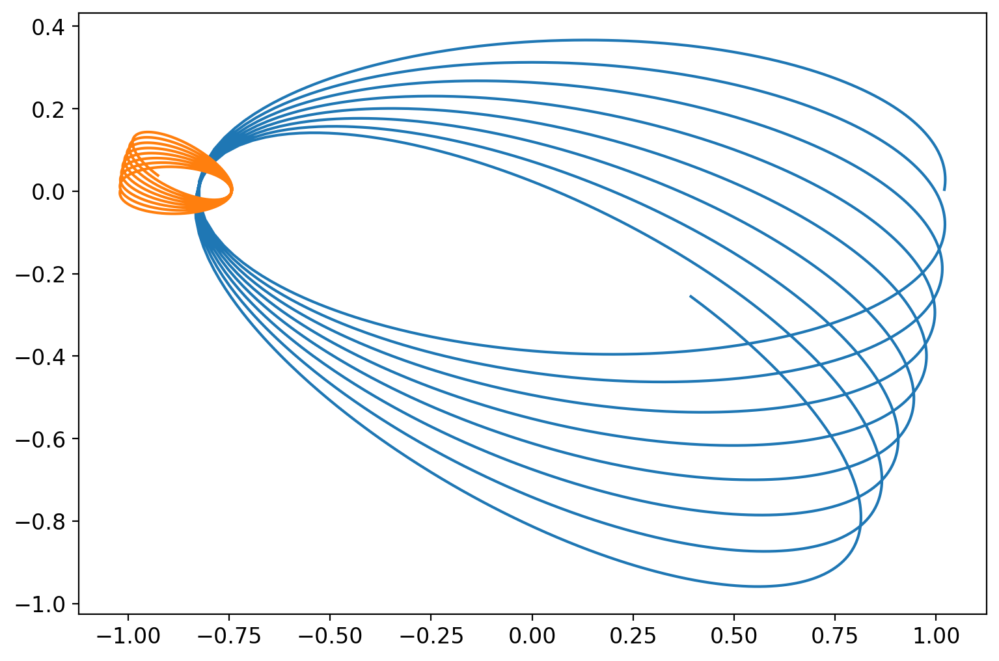

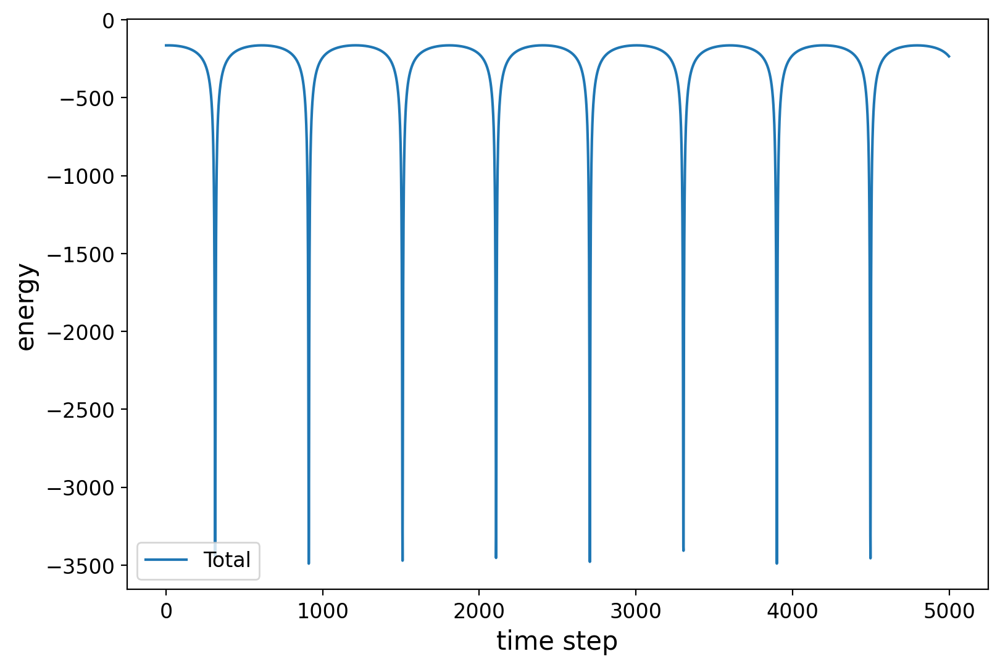

In [174]:
def sim(pos,mass,v,iN=2,dt=0.001,nsteps=50,iPlot=False,iOutput=0):
    #make the stars
    allstars = stars(mass,pos,v,iN)
    #simulate
    allstars.parallelAcc()
    allstars.totalE()
    allstars.firststep(dt)
    for t in range(nsteps):
        allstars.parallelAcc()
        allstars.totalE()
        allstars.step(dt)
    x1vals=np.reshape(allstars.posh,(nsteps,2*iN))
    vvals =np.reshape(allstars.velh,(nsteps,2*iN))
    if iPlot:
        for i0 in np.arange(iN):
            plt.plot(x1vals[:,2*i0],x1vals[:,2*i0+1])
        plt.show()

        plt.plot(range(nsteps),allstars.toth,label='Total')
        plt.legend()
        plt.xlabel('time step')
        plt.ylabel('energy')
        plt.show()
    if iOutput==0: #full trajectory
        return _,x1vals
    if iOutput==1: #output velocity and position
        return _,np.hstack((x1vals[-1],vvals[-1]))
    if iOutput==2: #differences from beginning
        dx1=x1vals[-1]-x1vals[0]
        dv1=vvals[-1]-vvals[0]
        return _,np.hstack((dx1,dv1))
    if iOutput==3:
        return _,vvals
    if iOutput==4:
        return x1vals,vvals

    
def makeTrainDataSet(iNPoints=15000,iN=2,iOutput=0):
    nsteps=50
    if iOutput == 4:
        indataset  = np.empty((0,4*nsteps), int)
    else: 
        indataset  = np.empty((0,10), int)
    if iOutput == 0 or iOutput == 3 or iOutput == 4:
        outdataset = np.empty((0,4*nsteps), float) 
    else:
        outdataset = np.empty((0,8), float) 
    for niter in range(iNPoints):
        pos,mass,v=randomSamplePlanets(iN)
        pIn,out=sim(pos,mass,v,nsteps=nsteps,iOutput=iOutput)
        outdataset= np.vstack((outdataset,out.flatten()))
        merge     = np.concatenate((v.flatten(),pos.flatten(),mass.flatten()))
        indataset = np.vstack((indataset,merge))
        #indataset = np.vstack((indataset,pIn.flatten()))
    return indataset,outdataset

pos,mass,v=randomSamplePlanets(2)
sim(pos,mass,v,nsteps=5000,iPlot=True)
trainset,targets=makeTrainDataSet()


Now our goal is to construct a deep learning model that allows us to predict the next 50 steps of our bath. Given our simulated dataset, we can go ahead and try to predict what is going on through a deep learning regression. 

Let's go ahead and make the model We will just make a simple ML model with a 4 layers and 20 hidden parameters

In [80]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset
from torch.autograd import Variable

class MLP(nn.Module):
    def __init__(self,n_inputs,n_outputs):
        super(MLP, self).__init__()
        self.layers = nn.Sequential(
            nn.Linear(n_inputs, 20),
            nn.ReLU(),
            nn.Linear(20, 20),
            nn.ReLU(),
            nn.Linear(20, 20),
            nn.ReLU(),
            nn.Linear(20, 20),
            nn.ReLU(),
            nn.Linear(20, n_outputs),
        )
        
    def forward(self, x):
        x = self.layers(x)
        return x

def train(x,y,net,loss_func,opt,sched,nepochs):
    net.train(True)
    for epoch in range(nepochs):
        prediction = net(x)
        opt.zero_grad()
        loss = loss_func(prediction,y) 
        loss.backward() 
        opt.step()
        if epoch % 500 == 0: 
            print('[%d] loss: %.4f ' % (epoch + 1, loss.item()  ))
    sched.step()
    return

model     = MLP(trainset.shape[1],targets.shape[1])
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.1, last_epoch=-1, verbose=False)
loss_fn   =  nn.MSELoss()

Finally, we can go ahead and train this guy

In [81]:
tmp_tot    = torch.tensor(trainset).float()
tmp_label  = torch.tensor(targets).float()
train(tmp_tot,tmp_label,model,loss_fn,optimizer,scheduler,15001)

[1] loss: 0.8917 
[501] loss: 0.0010 
[1001] loss: 0.0004 
[1501] loss: 0.0001 
[2001] loss: 0.0001 
[2501] loss: 0.0005 
[3001] loss: 0.0002 
[3501] loss: 0.0001 
[4001] loss: 0.0000 
[4501] loss: 0.0000 
[5001] loss: 0.0001 
[5501] loss: 0.0000 
[6001] loss: 0.0000 
[6501] loss: 0.0000 
[7001] loss: 0.0000 
[7501] loss: 0.0001 
[8001] loss: 0.0000 
[8501] loss: 0.0000 
[9001] loss: 0.0000 
[9501] loss: 0.0000 
[10001] loss: 0.0000 
[10501] loss: 0.0004 
[11001] loss: 0.0000 
[11501] loss: 0.0000 
[12001] loss: 0.0000 
[12501] loss: 0.0000 
[13001] loss: 0.0000 
[13501] loss: 0.0000 
[14001] loss: 0.0000 
[14501] loss: 0.0001 
[15001] loss: 0.0001 


Now we can go ahead and run on a validation dataset and see how things are performing. 

In [82]:
valid_trainset,valid_targets=makeTrainDataSet(iNPoints=10)
tmp_train  = torch.tensor(valid_trainset).float()
tmp_target = torch.tensor(valid_targets).float()
output_targets=model(tmp_train)
print(output_targets.shape)

#output_targets=output_targets.reshape(output_targets.shape[0],5,4).detach().numpy()
#valid_targets =tmp_target.reshape(tmp_target.shape[0],5,4).detach().numpy()
output_targets=output_targets.reshape(output_targets.shape[0],50,4).detach().numpy()
valid_targets =tmp_target.reshape(tmp_target.shape[0],50,4).detach().numpy()
#output_targets=output_targets.reshape(output_targets.shape[0],1,8).detach().numpy()
#valid_targets =tmp_target.reshape(tmp_target.shape[0],1,8).detach().numpy()

torch.Size([10, 200])


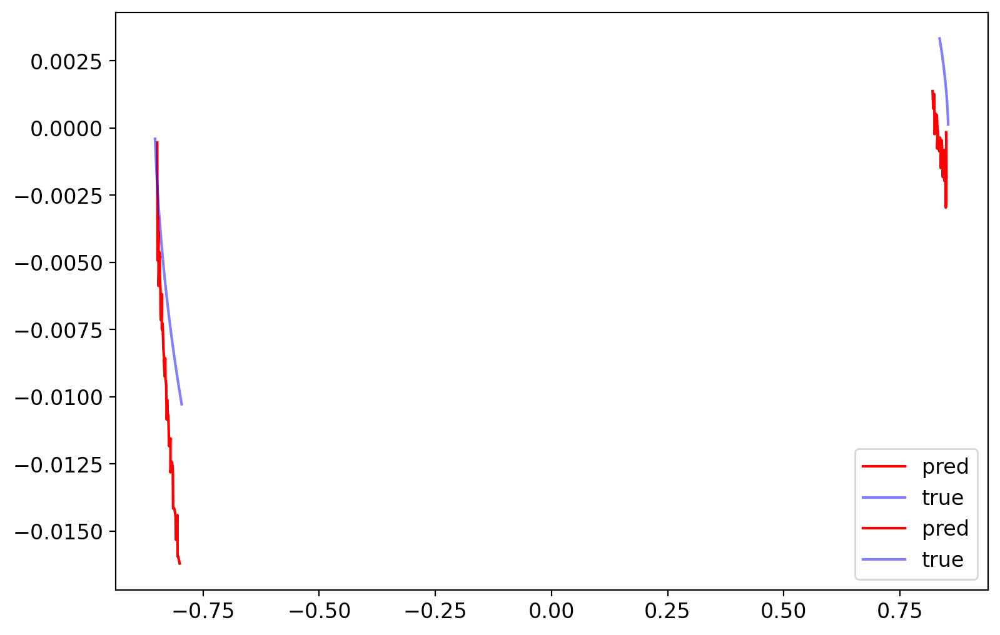

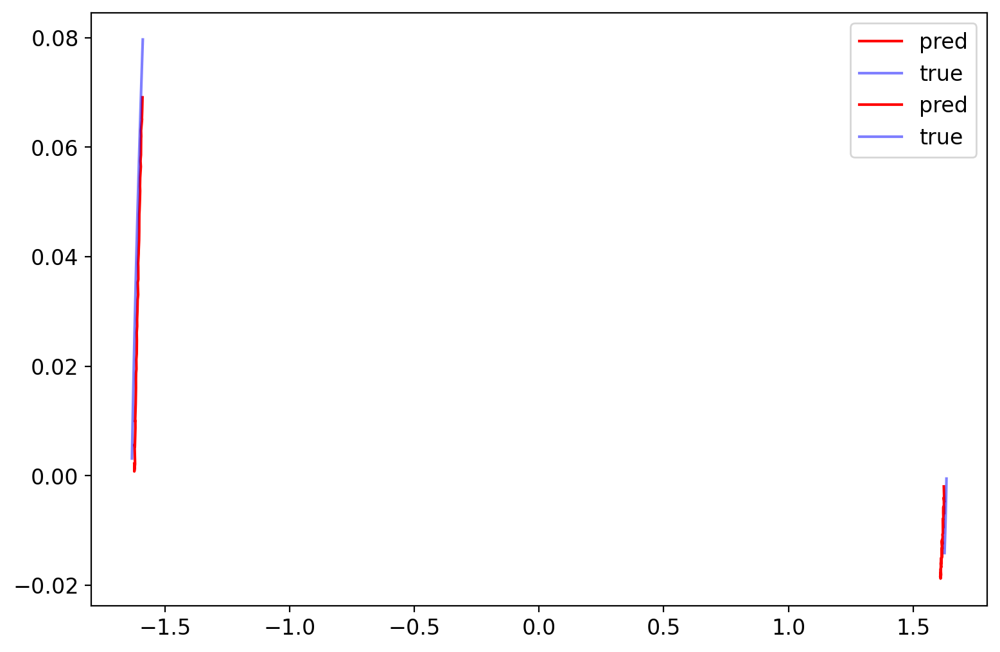

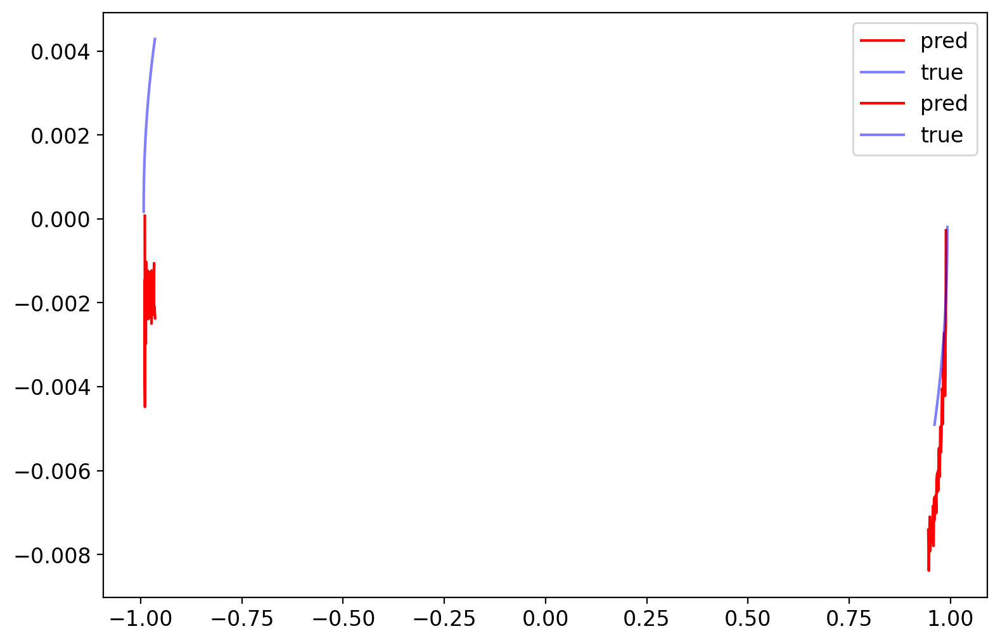

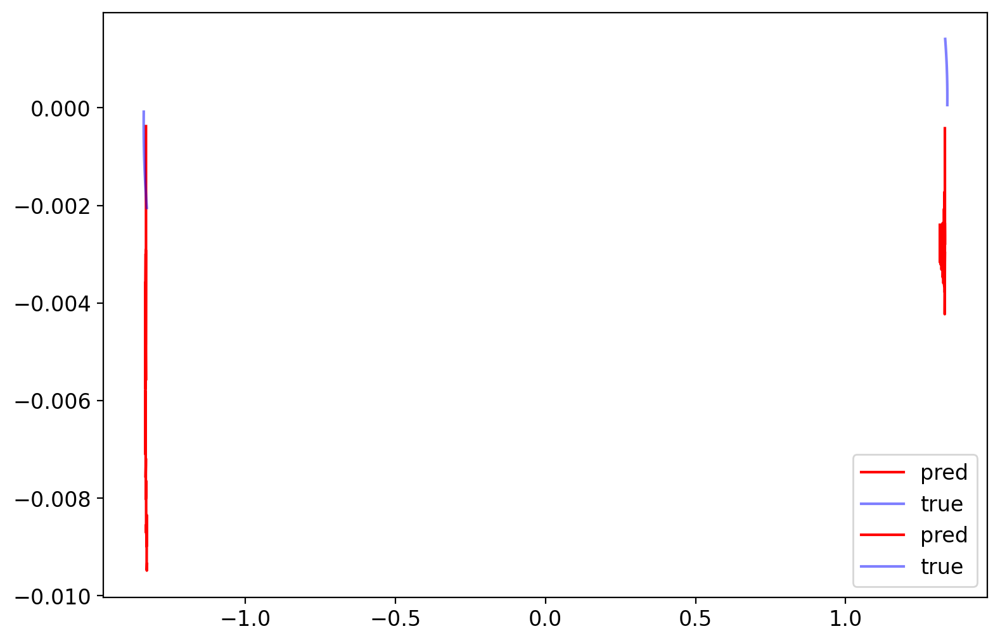

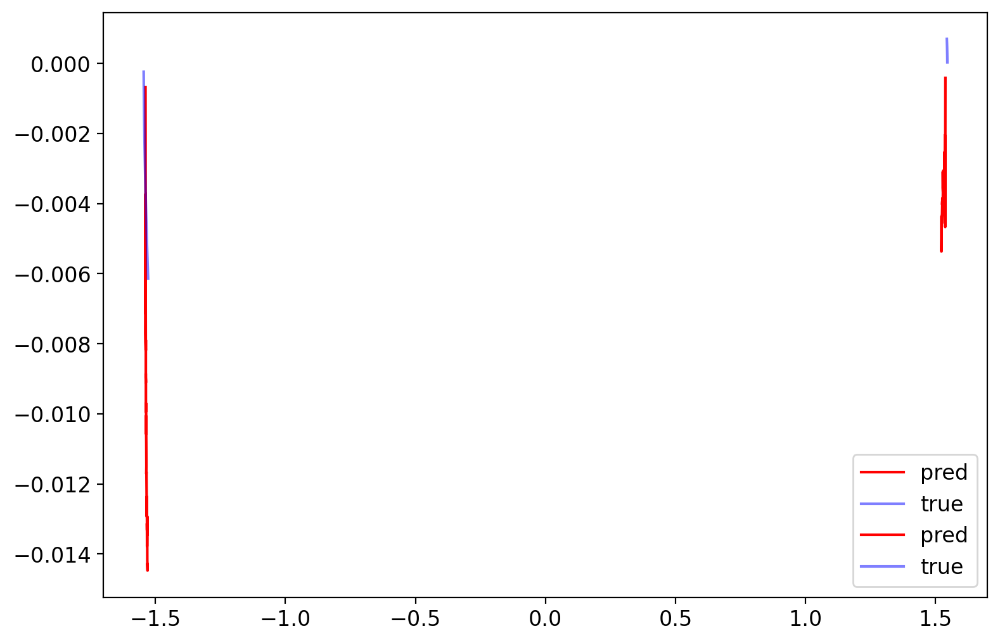

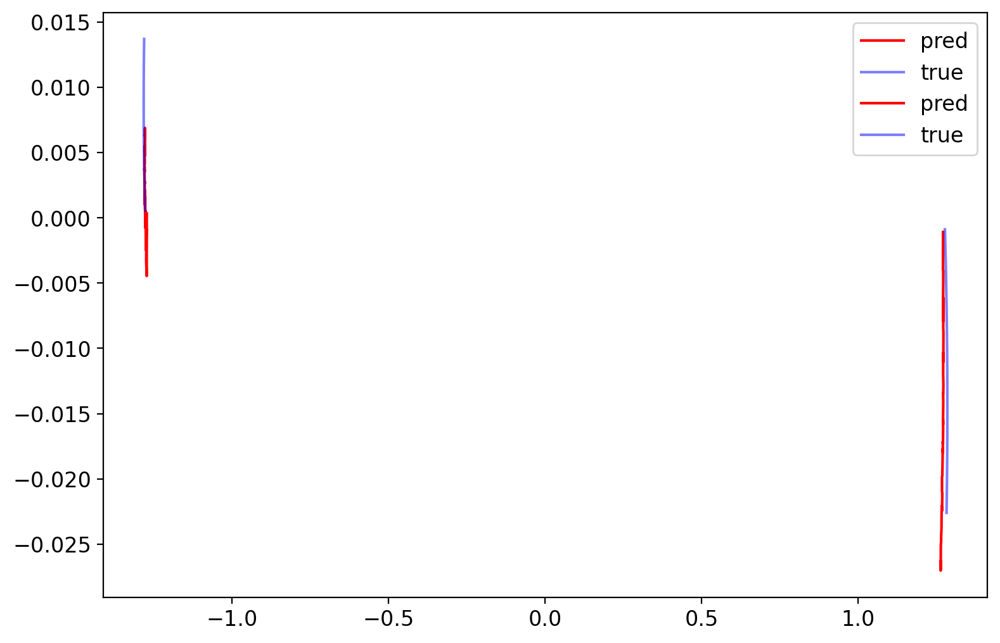

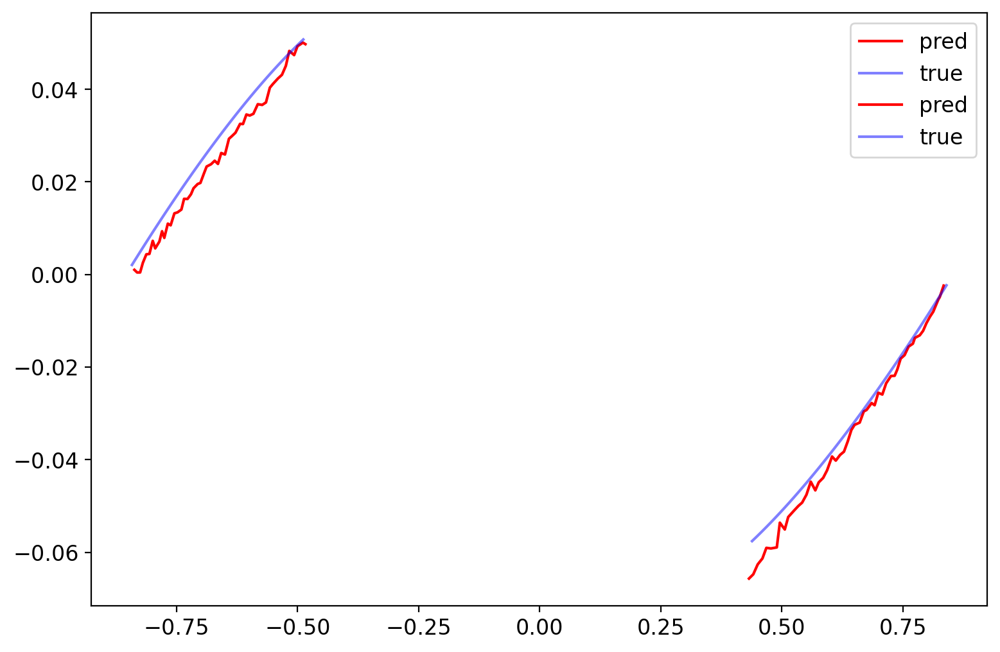

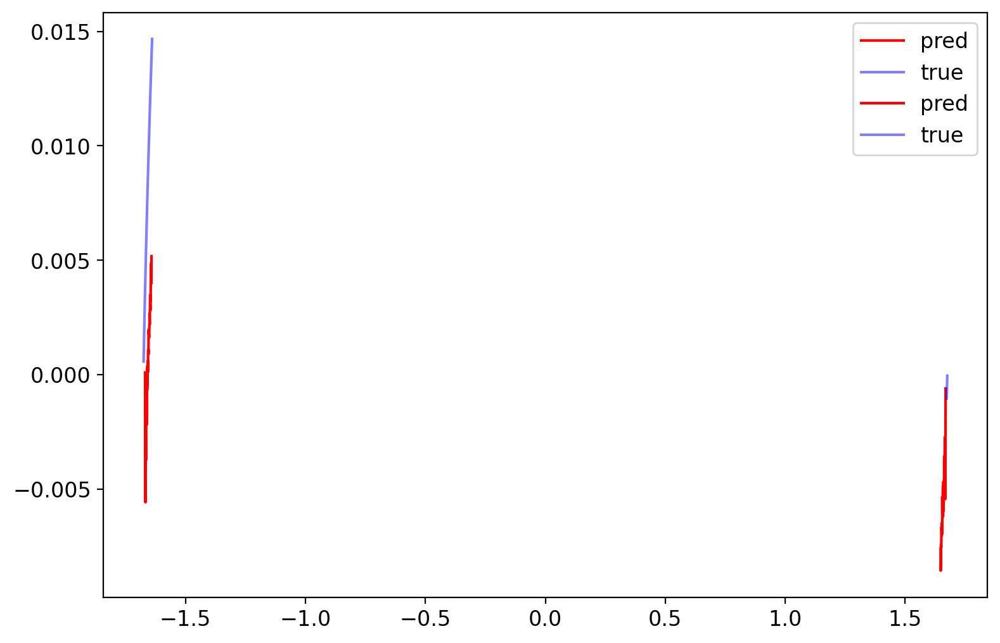

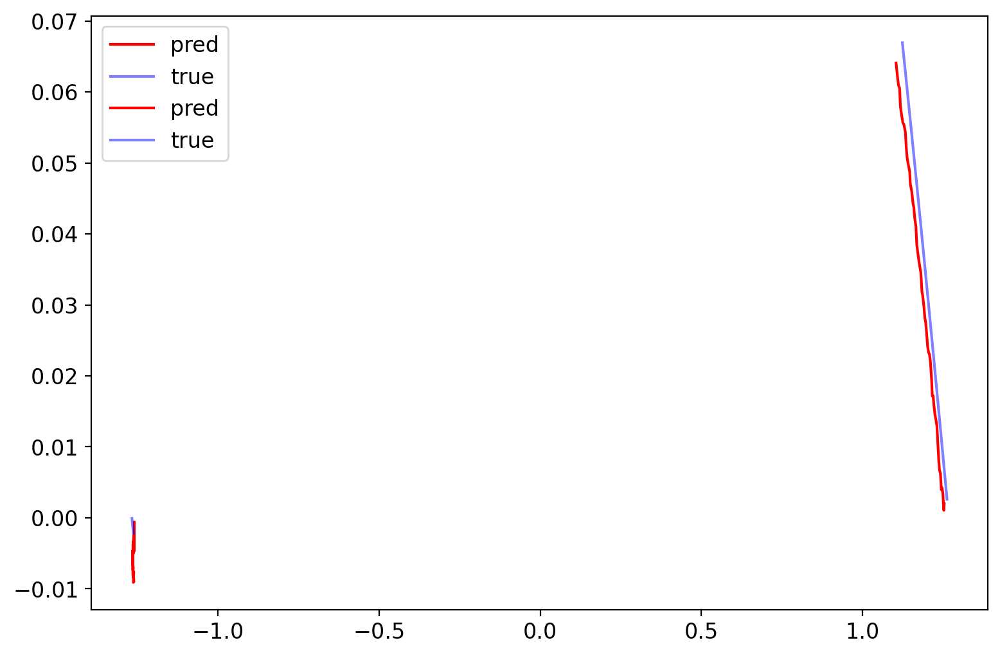

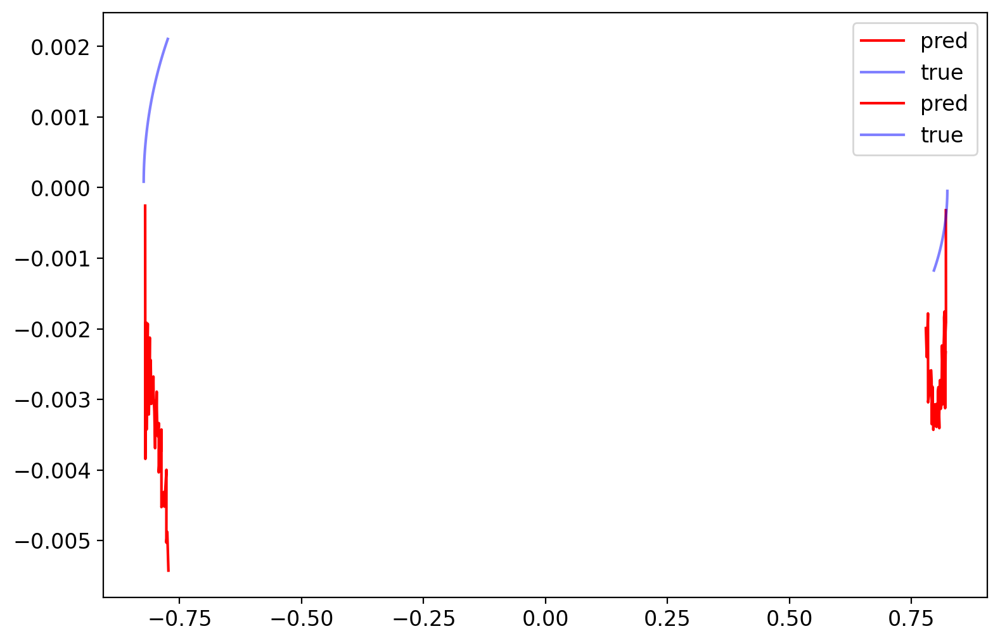

In [83]:
for batch in np.arange(10):
    for i0 in np.arange(2):
        plt.plot(output_targets[batch,:,0+2*i0],output_targets[batch,:,1+2*i0], color='red',label='pred')
        plt.plot(valid_targets [batch,:,0+2*i0],valid_targets [batch,:,1+2*i0], color='blue',alpha=0.5,label='true')
    plt.legend()
    plt.show()

Ok, its nice that we can predict the paths quite well, and I find it pertty remarkable to be honest. However, to really make a power prediction, what we would like to do is predict the position and velocity after 50 steps. This way we can reduce the overall step size, and let the neural network do the "inpainting" of what is going on. 

In [197]:
trainset,targets=makeTrainDataSet(iOutput=2)
model2     = MLP(trainset.shape[1],targets.shape[1])
optimizer = torch.optim.Adam(model2.parameters(), lr=0.01)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.1, last_epoch=-1, verbose=False)
loss_fn   =  nn.MSELoss()
tmp_tot    = torch.tensor(trainset).float()
tmp_label  = torch.tensor(targets).float()
train(tmp_tot,tmp_label,model2,loss_fn,optimizer,scheduler,15001)

[1] loss: 14.7477 
[501] loss: 0.1146 
[1001] loss: 0.0510 
[1501] loss: 0.0348 
[2001] loss: 0.2327 
[2501] loss: 0.1088 
[3001] loss: 0.0545 
[3501] loss: 0.0329 
[4001] loss: 0.0242 
[4501] loss: 0.0291 
[5001] loss: 0.1560 
[5501] loss: 0.0874 
[6001] loss: 0.0742 
[6501] loss: 0.0577 
[7001] loss: 0.2626 
[7501] loss: 0.0301 
[8001] loss: 0.0253 
[8501] loss: 0.0291 
[9001] loss: 0.0221 
[9501] loss: 0.0193 
[10001] loss: 0.0212 
[10501] loss: 0.0770 
[11001] loss: 0.0540 
[11501] loss: 0.0472 
[12001] loss: 0.0406 
[12501] loss: 0.0420 
[13001] loss: 0.0322 
[13501] loss: 0.0312 
[14001] loss: 0.0278 
[14501] loss: 0.0171 
[15001] loss: 0.8058 


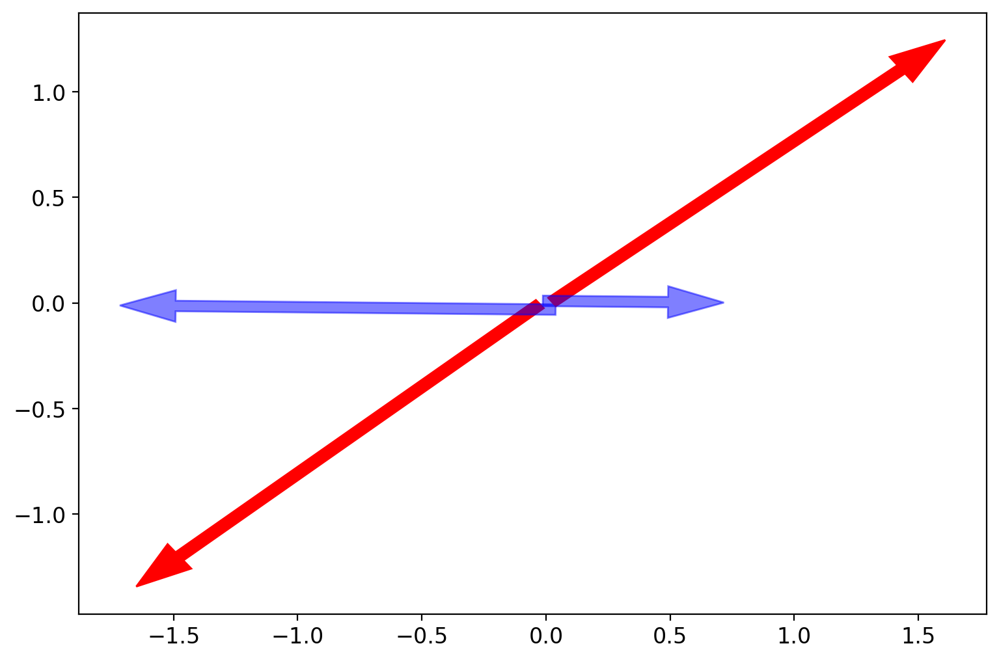

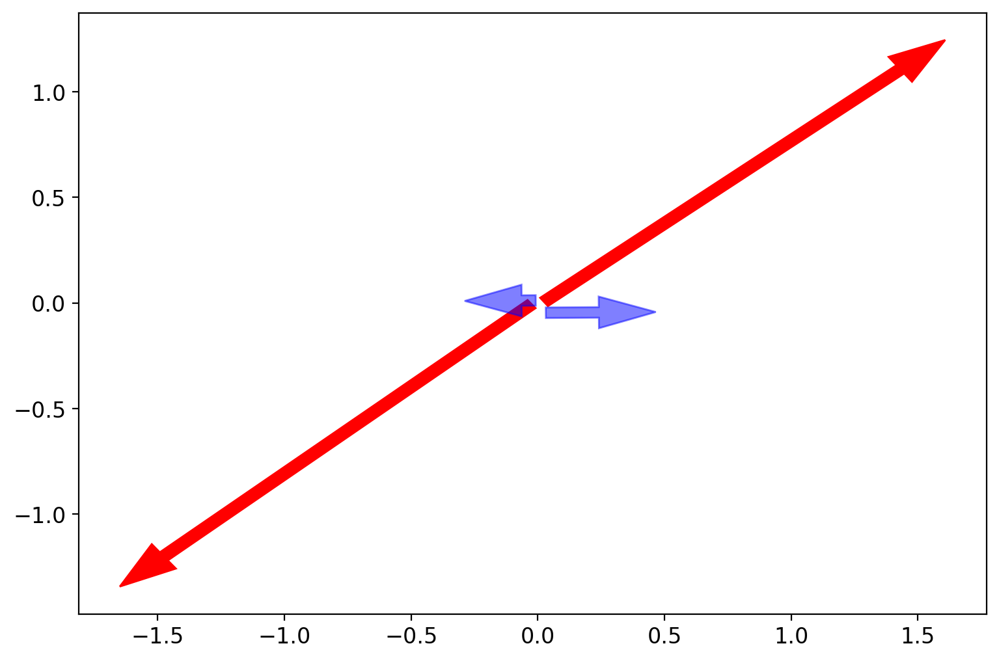

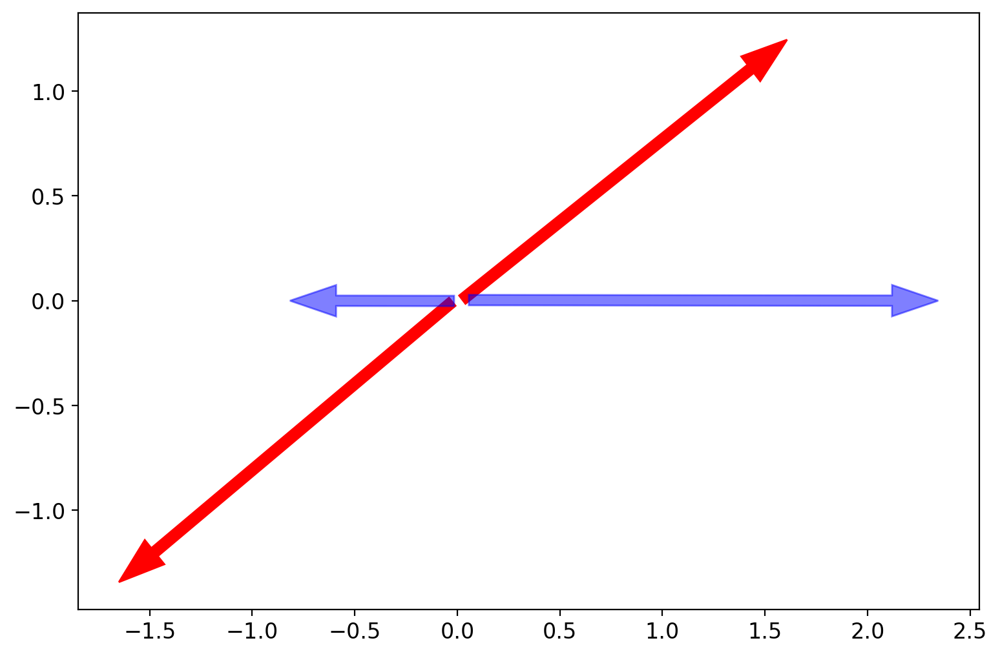

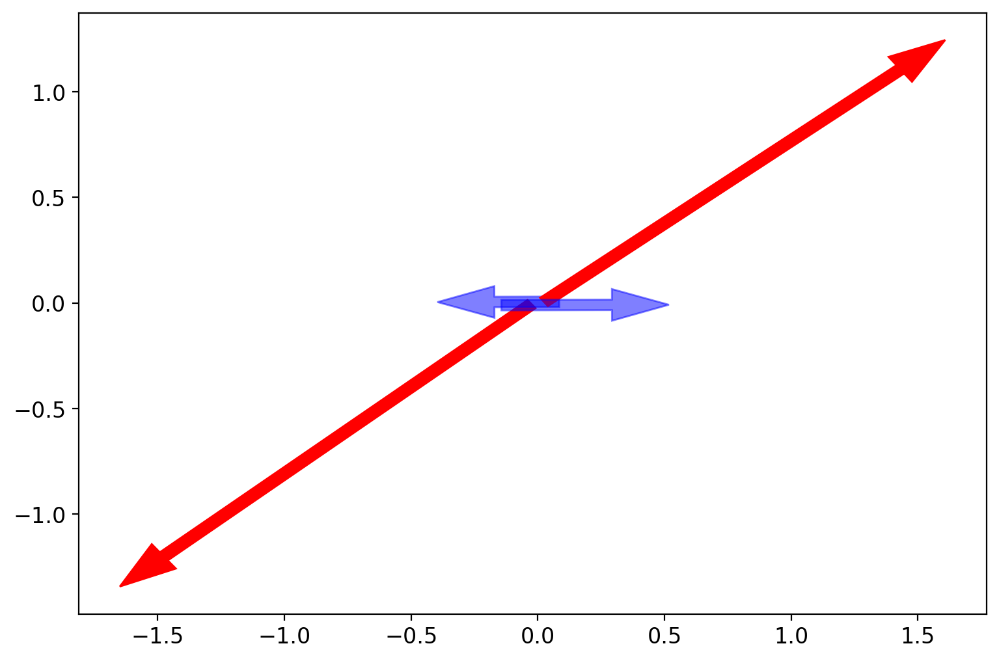

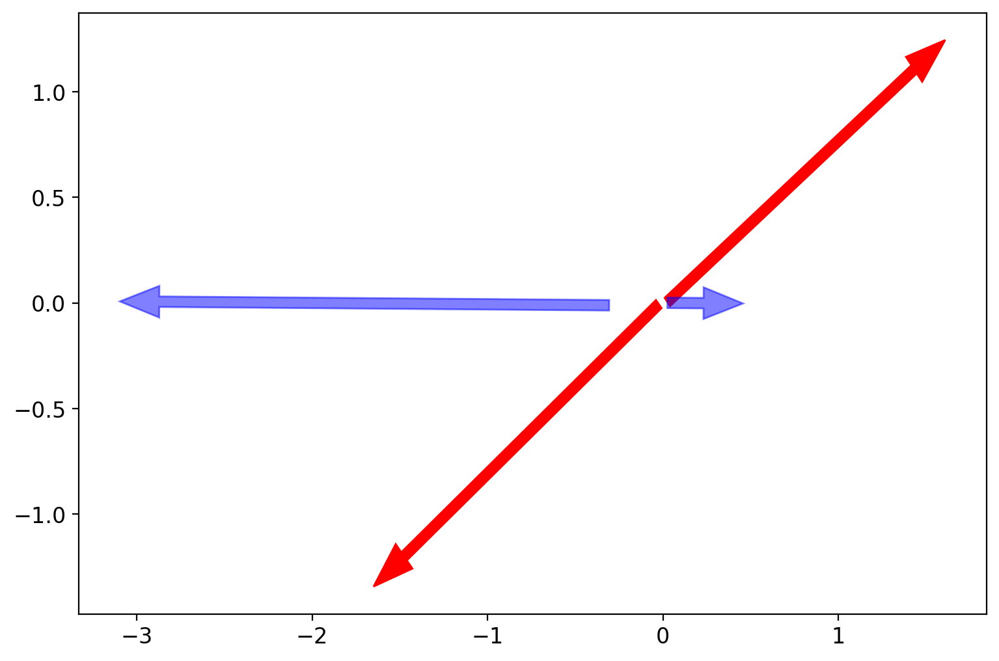

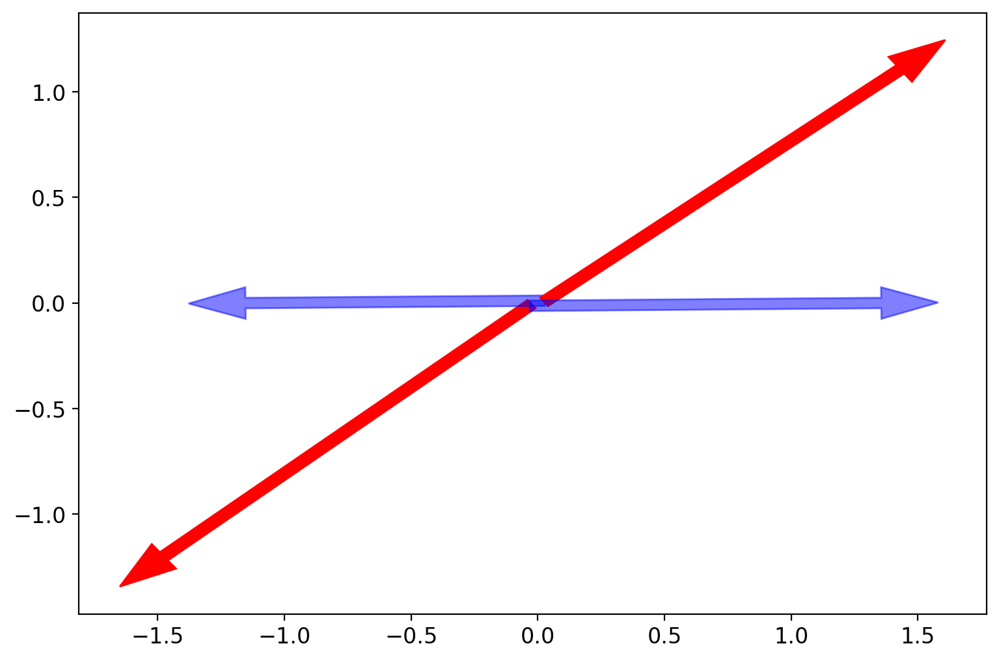

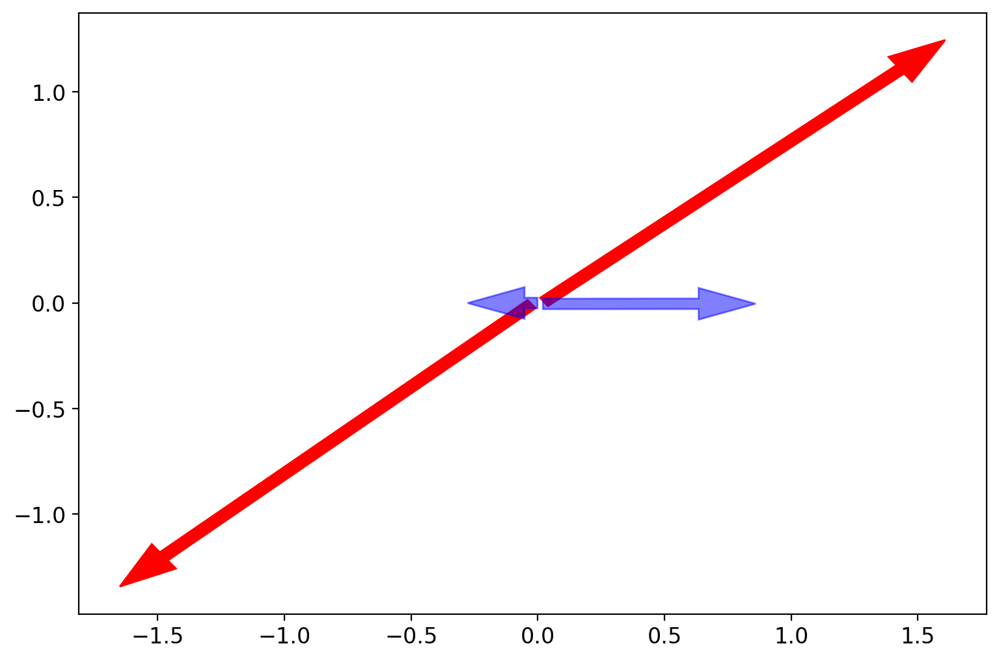

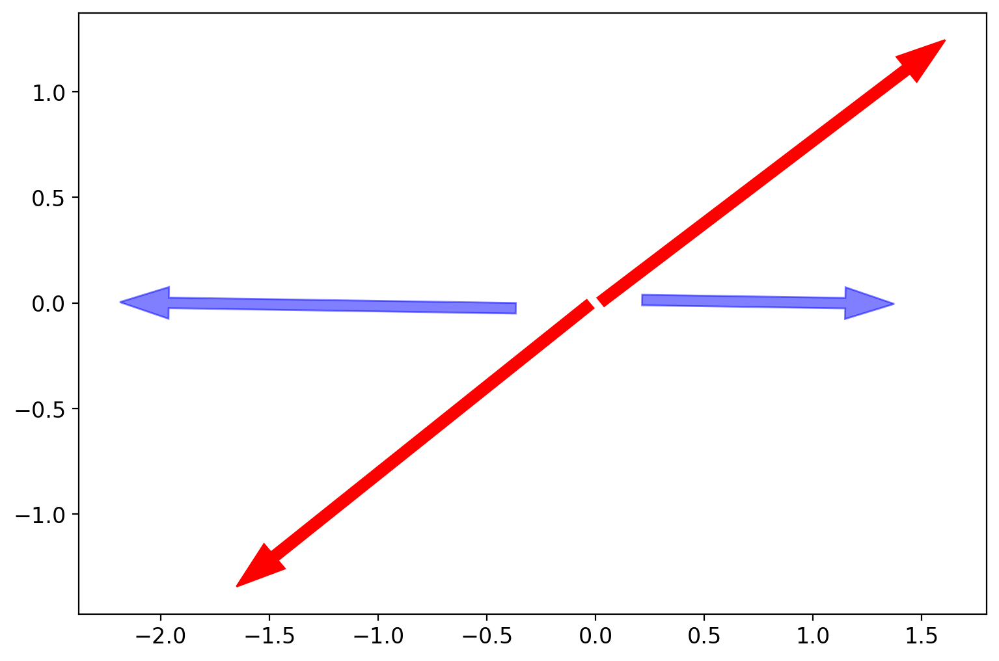

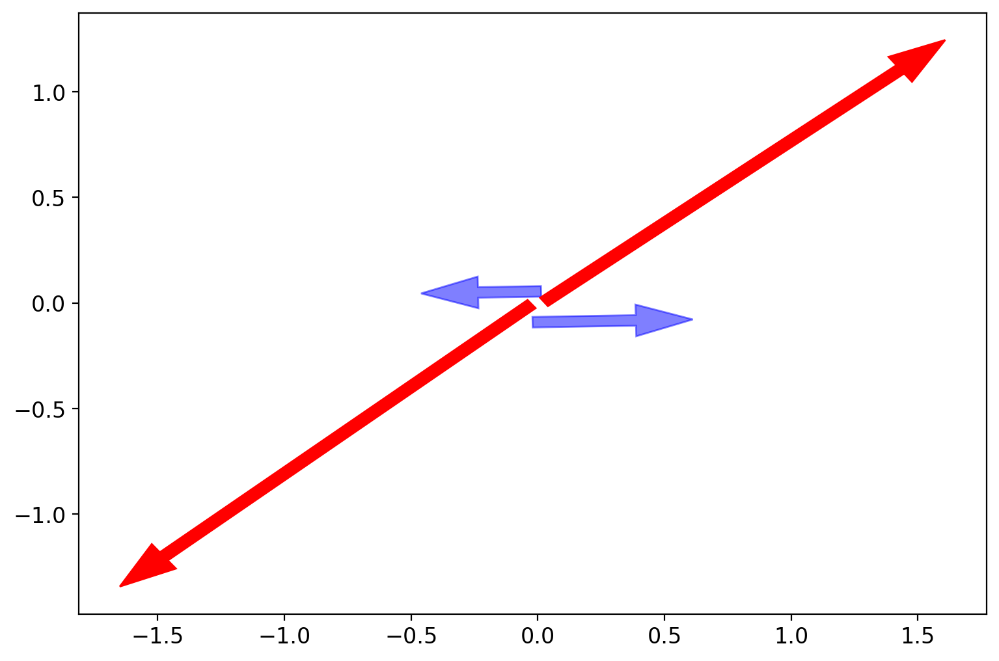

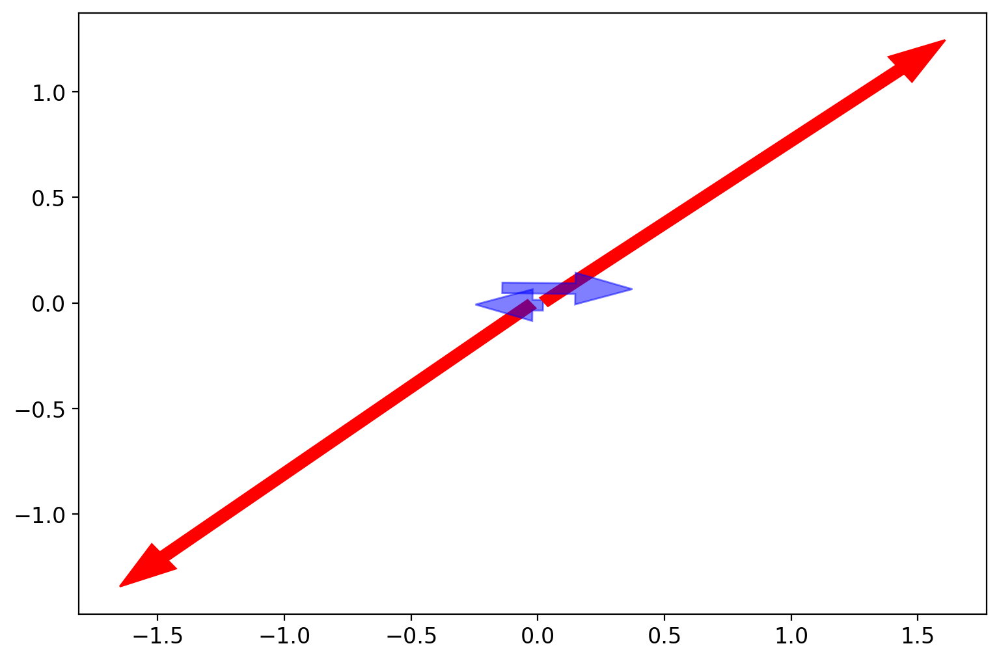

In [196]:
valid_trainset,valid_targets=makeTrainDataSet(iNPoints=10,iOutput=2)
tmp_train  = torch.tensor(valid_trainset).float()
tmp_target = torch.tensor(valid_targets).float()
output_targets=model2(tmp_train)
output_targets=output_targets.reshape(output_targets.shape[0],1,8).detach().numpy()
valid_targets =tmp_target.reshape(tmp_target.shape[0],1,8).detach().numpy()
#print(valid_targets.shape)
for batch in np.arange(10):
    for i0 in np.arange(2):
        plt.arrow(output_targets[batch,0,0+2*i0],output_targets[batch,0,1+2*i0],output_targets[batch,0,4+2*i0],output_targets[batch,0,5+2*i0],width=.05, edgecolor='red',facecolor='red')
        plt.arrow(valid_targets [batch,0,0+2*i0],valid_targets [batch,0,1+2*i0],valid_targets [batch,0,4+2*i0],valid_targets [batch,0,5+2*i0],width=.05, edgecolor='blue',facecolor='blue',alpha=0.5)
    plt.show()

Now, what we can do is try to improve our simulation by requiring that our system conserves energy. The simplest way to do that is to add energy conservation as a constraint in the loss function. Since we are computing the the change in the relative position of the planets, what this means is that the derivative of the total energy is zero. We can write this as: 

$$
\mathcal{H} = \frac{1}{2} m_{1} v_{1}^{2} + \frac{1}{2} m_{2} v_{2}^2 + \frac{Gm_{1}m_{2}}{|\vec{r}_{1}-\vec{r}_{2}|}\\
\frac{d\mathcal{H}}{dt} = 0 \\
\frac{d\mathcal{H}}{dt}  = mv_{1} \frac{dv_{1}}{dt} + mv_{2} \frac{dv_{2}}{dt} + \frac{Gm_{1}m_{2}}{|\vec{r}_{1}-\vec{r}_{2}|^{2}}\left(\frac{dr_{1}}{dt} + \frac{dr_2}{dt}\right) = 0
$$

Additionally, we can could also impose angular momentum conservation

$$
L_{\rm tot} = m_{1} v_{1} r_{1} +  m_{2} v_{2} r_{2}\\
\frac{d L_{\rm tot}}{dt} = m_{1}\left(\frac{dv_{1}}{dt} r_{1} + v_{1}\frac{dr_{1}}{dt}\right) + m_{2}\left(\frac{dv_{2}}{dt} r_{2} + v_{2}\frac{dr_{2}}{dt}\right)
$$

Mostly in the inerest of being lazy, lets add angular momentum conservation conservation as a constraint. 

In [192]:
def energy(iVec):
    dr = torch.pow(torch.norm(iVec[:,4:6]-iVec[:,6:8],dim=1),-0.5)
    v2 = torch.sum(iVec[:,0:4]**2,dim=1)
    return dr+v2

def newEloss(prediction,y_data,iloss=loss_fn,lam=1e-1):
    #rint(prediction.shape,y_data.shape)
    mse=iloss(prediction,y_data)
    en1=energy(y_data)
    en0=energy(prediction)
    #grad=torch.autograd.grad(en0, inputs, torch.ones_like(en0), create_graph=True)[0]
    return mse + lam*torch.mean((en1-en0)**2)

def ang(iInput,iPred):
    im1 = iInput[:,8]
    im2 = iInput[:,9]
    iv1 = iInput[:,0:2]
    iv2 = iInput[:,2:4]
    ir1 = iInput[:,4:6]
    ir2 = iInput[:,6:8]
    dr1 = iPred[:,0:2]
    dr2 = iPred[:,2:4]
    dv1 = iPred[:,4:6]
    dv2 = iPred[:,6:8]
    return im1*(torch.sum(dv1*ir1,dim=1)+torch.sum(iv1*dr1,dim=1))+im2*(torch.sum(dv2*ir2,dim=1)+torch.sum(iv2*dr2,dim=1))
    
def newAloss(prediction,y_data,iInput,iloss=loss_fn,lam=1e-5):
    dL=ang(iInput,prediction)
    dLt=ang(iInput,y_data)
    mse=iloss(prediction,y_data)
    return mse + lam*torch.mean((dL-dLt)**2)
    #return mse + lam*torch.mean(dL**2)
    
valid_trainset,valid_targets=makeTrainDataSet(iNPoints=10,iOutput=2)
tmp_train  = torch.tensor(valid_trainset).float()
tmp_target = torch.tensor(valid_targets).float()
output_targets=model2(tmp_train)

def trainA(x,y,net,loss_func,opt,sched,nepochs):
    net.train(True)
    for epoch in range(nepochs):
        prediction = net(x)
        opt.zero_grad()
        loss = loss_func(prediction,y,x) 
        loss.backward() 
        opt.step()
        if epoch % 500 == 0: 
            print('[%d] loss: %.4f ' % (epoch + 1, loss.item()  ))
    sched.step()
    return

losstest = newAloss(output_targets,tmp_target,tmp_train,loss_fn)
print(losstest,losstest.backward())

tensor(48.4172, grad_fn=<AddBackward0>) None


In [193]:
trainA(tmp_tot,tmp_label,model2,newAloss,optimizer,scheduler,5001)

[1] loss: 1777.3689 
[501] loss: 1137.9236 
[1001] loss: 918.1672 
[1501] loss: 682.5453 
[2001] loss: 482.7853 
[2501] loss: 353.6434 
[3001] loss: 203.3540 
[3501] loss: 93.2168 
[4001] loss: 52.9219 
[4501] loss: 40.6472 
[5001] loss: 33.5955 


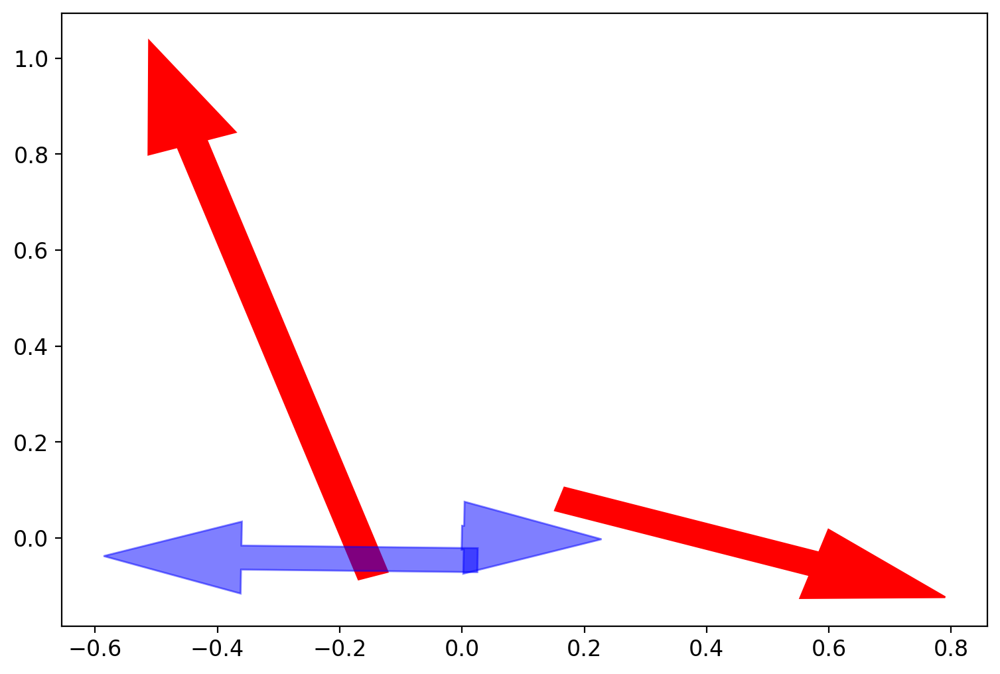

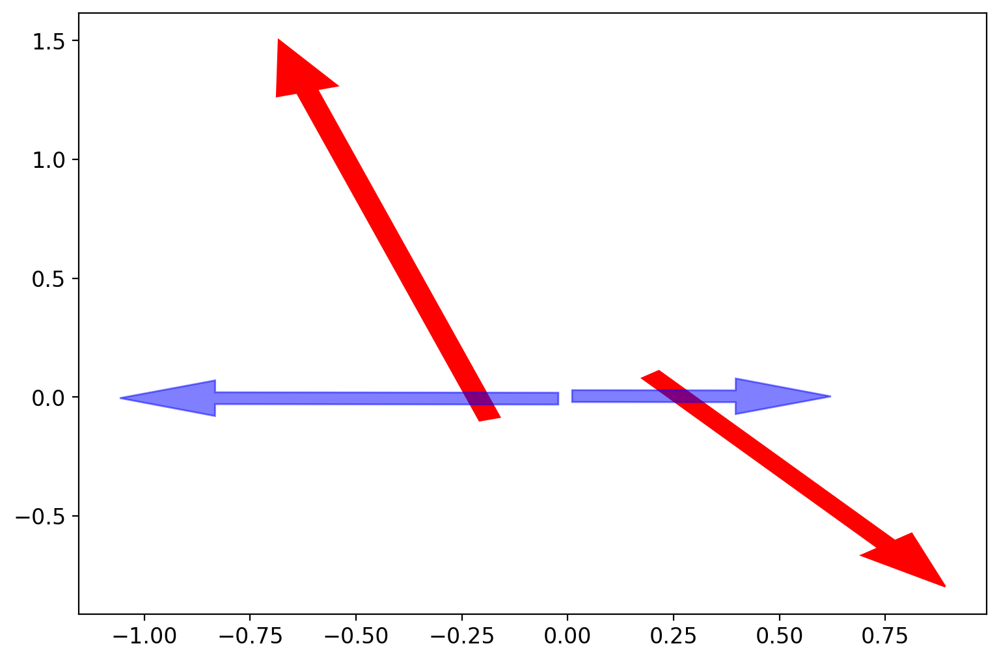

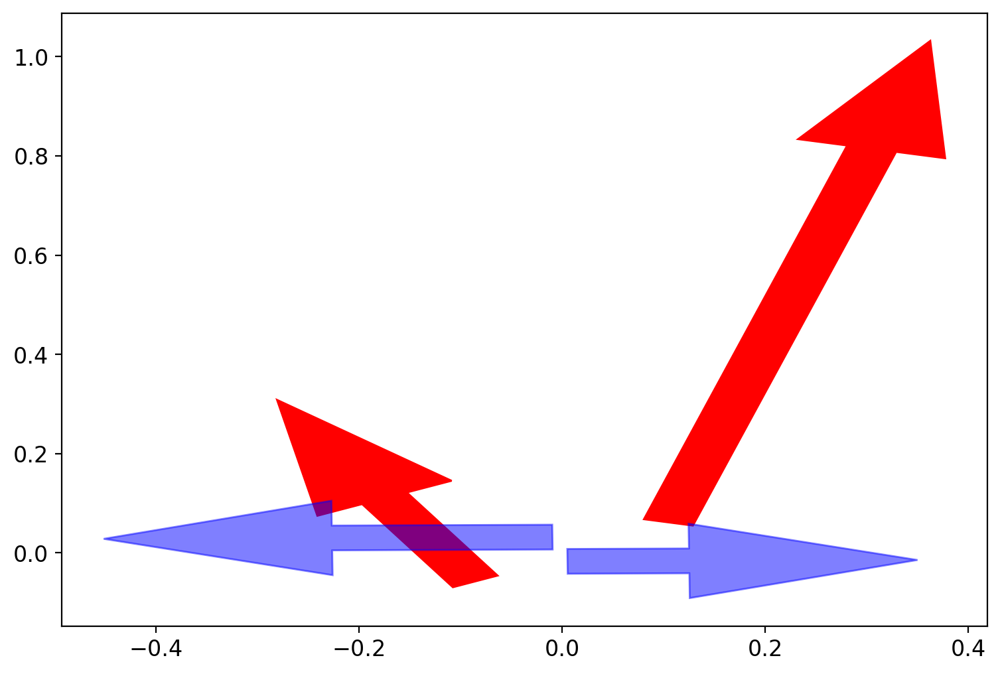

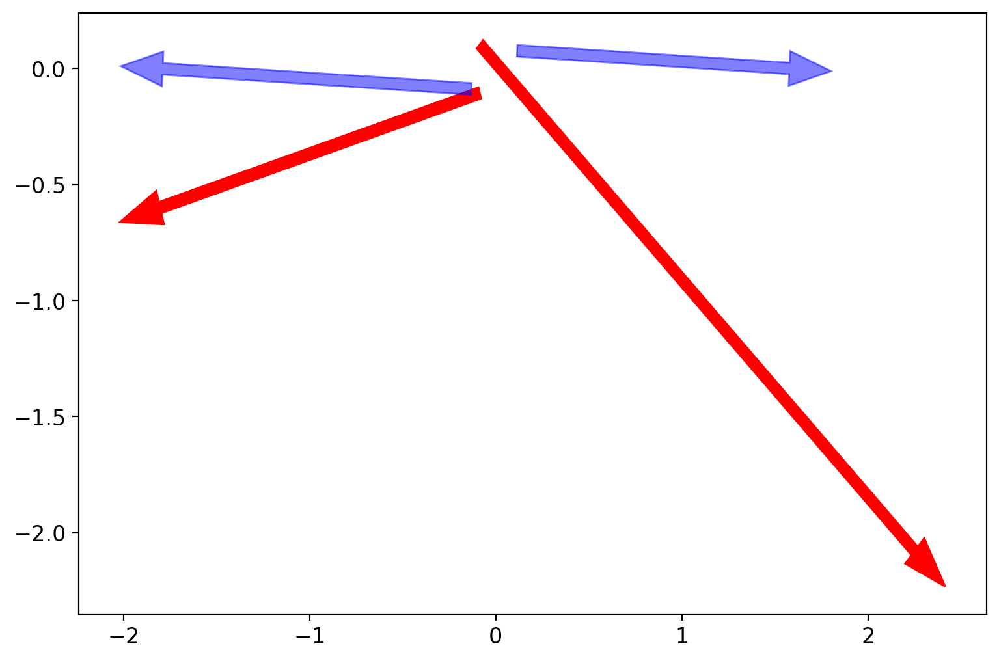

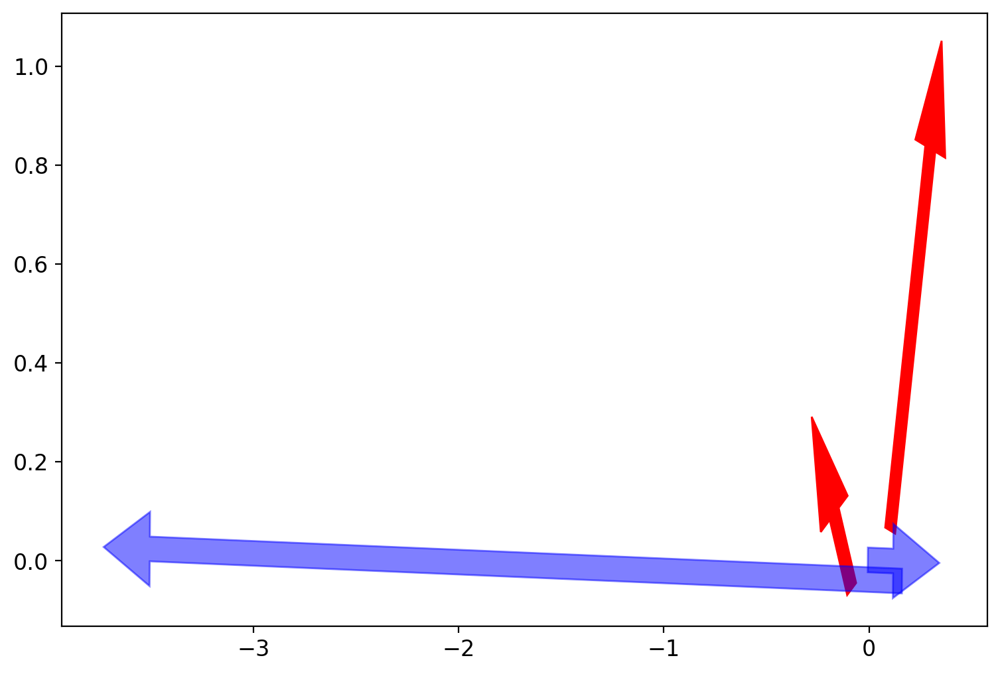

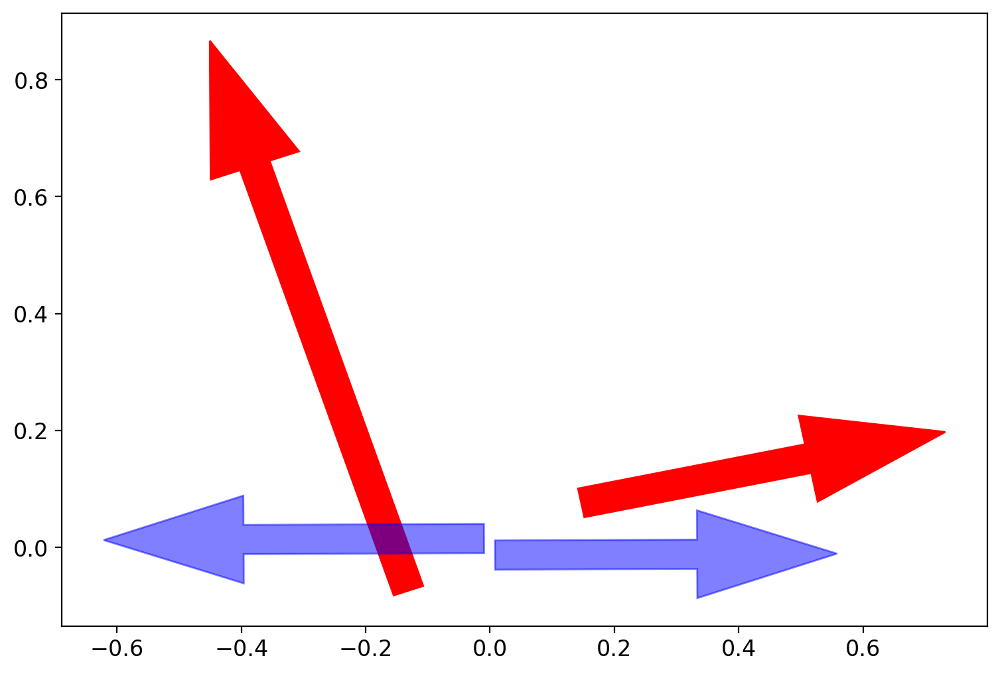

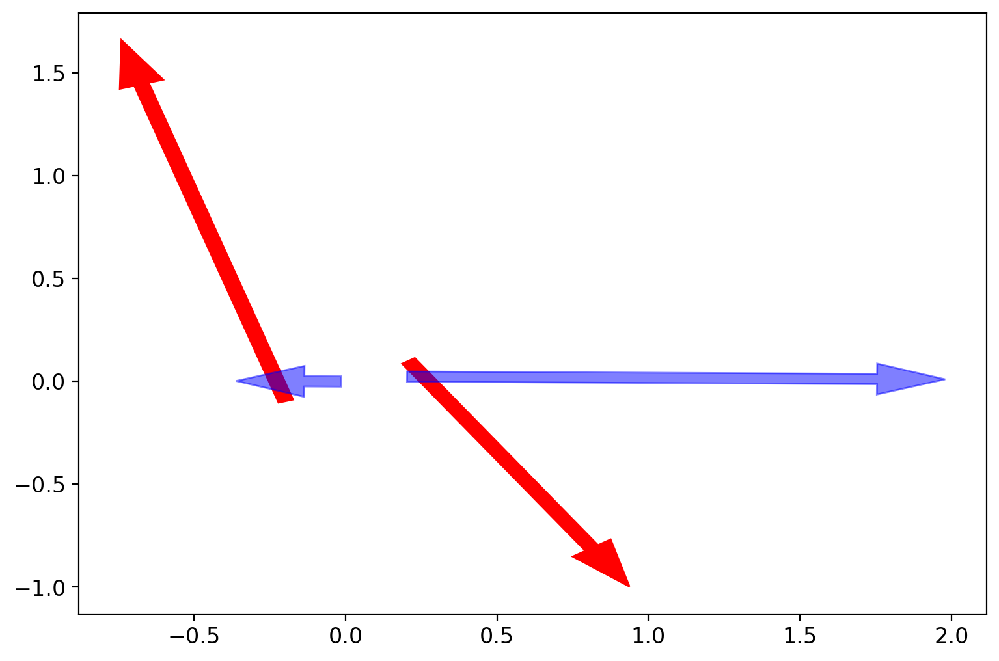

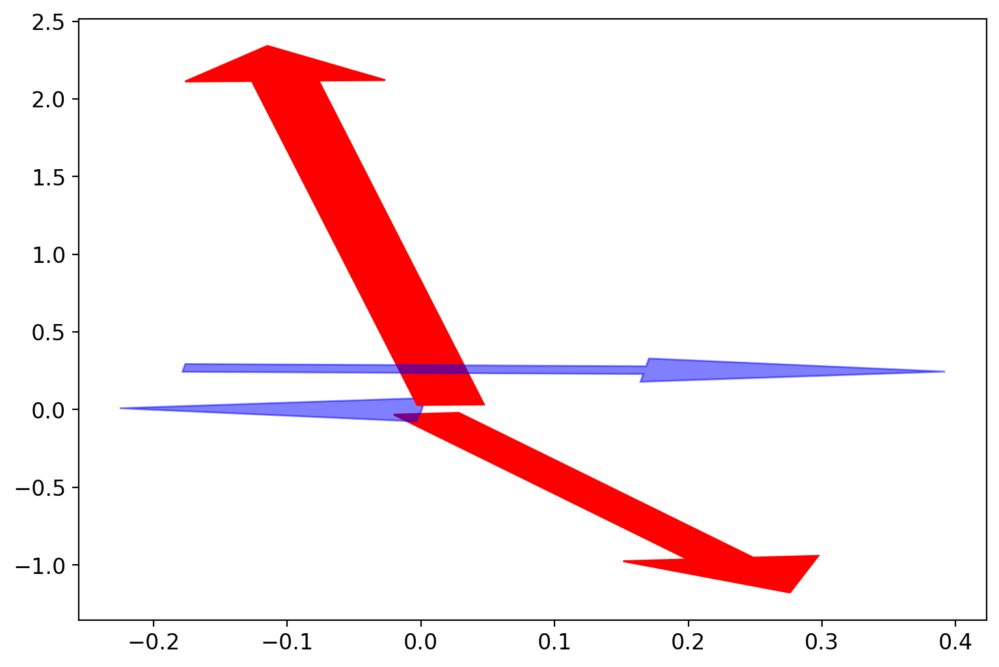

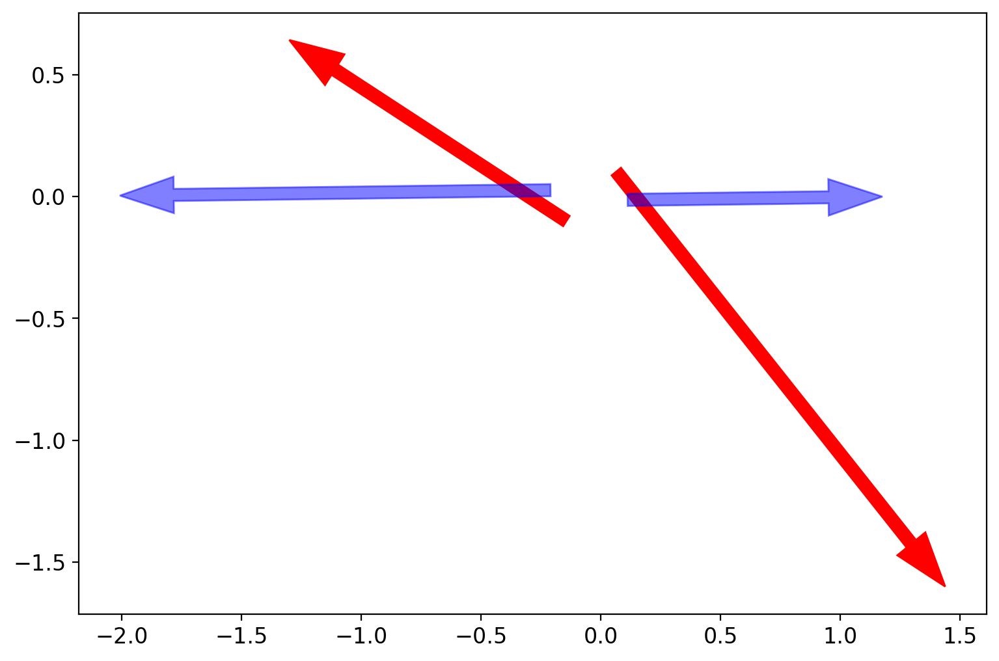

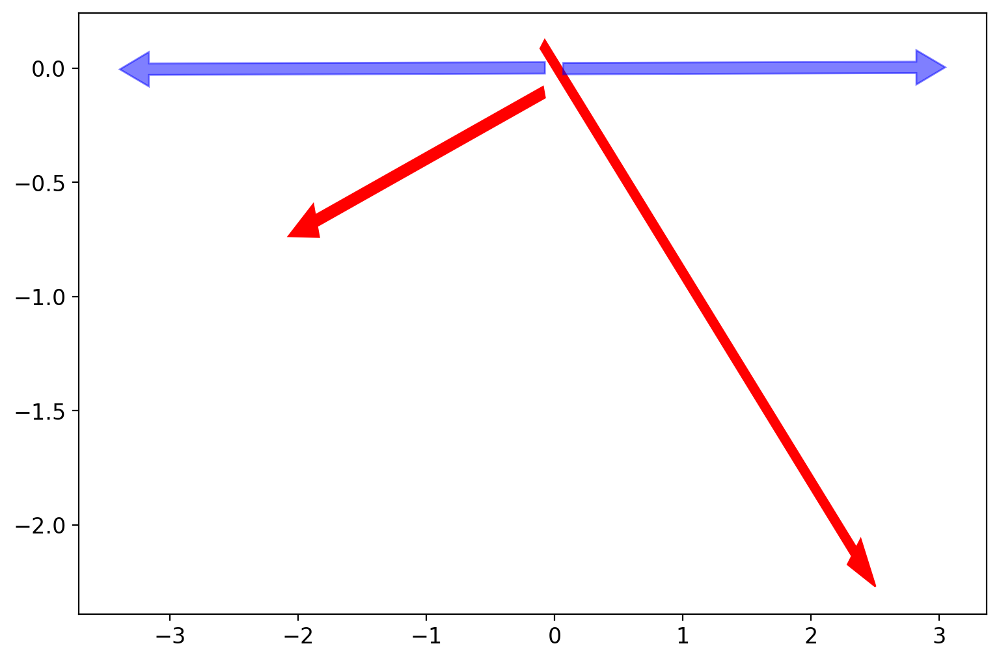

In [194]:
valid_trainset,valid_targets=makeTrainDataSet(iNPoints=10,iOutput=2)
tmp_train  = torch.tensor(valid_trainset).float()
tmp_target = torch.tensor(valid_targets).float()
output_targets=model2(tmp_train)
output_targets=output_targets.reshape(output_targets.shape[0],1,8).detach().numpy()
valid_targets =tmp_target.reshape(tmp_target.shape[0],1,8).detach().numpy()
#print(valid_targets.shape)
for batch in np.arange(10):
    for i0 in np.arange(2):
        plt.arrow(output_targets[batch,0,0+2*i0],output_targets[batch,0,1+2*i0],output_targets[batch,0,4+2*i0],output_targets[batch,0,5+2*i0],width=.05, edgecolor='red',facecolor='red')
        plt.arrow(valid_targets [batch,0,0+2*i0],valid_targets [batch,0,1+2*i0],valid_targets [batch,0,4+2*i0],valid_targets [batch,0,5+2*i0],width=.05, edgecolor='blue',facecolor='blue',alpha=0.5)
    plt.show()

Now, we can go ahead and test our whole setup. The tricky bit is that to run the inference, we have to rotate our setup back inot the sate where the y-values are zero. 

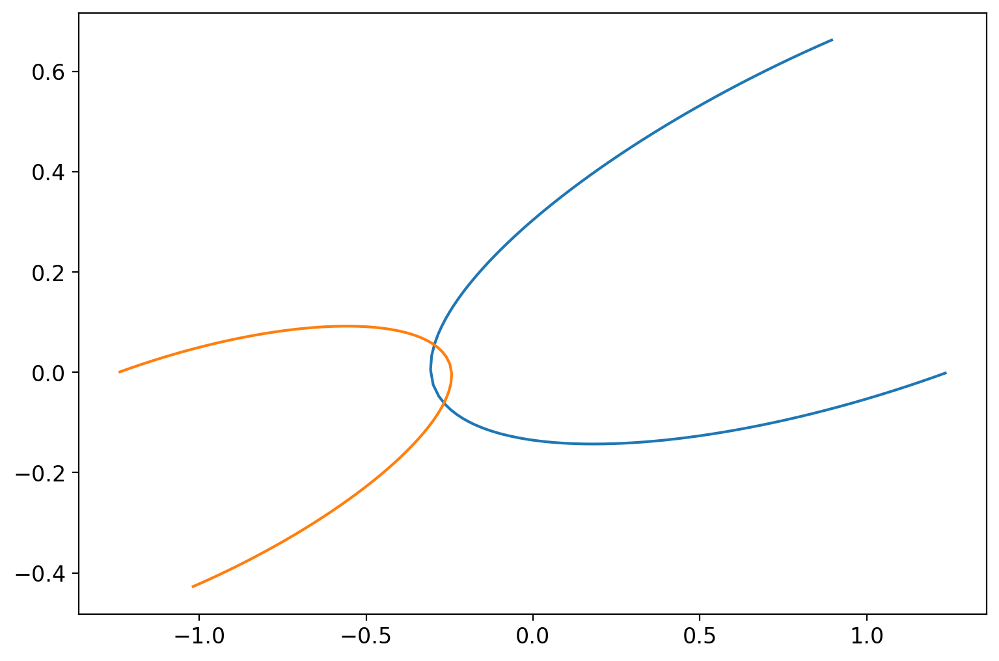

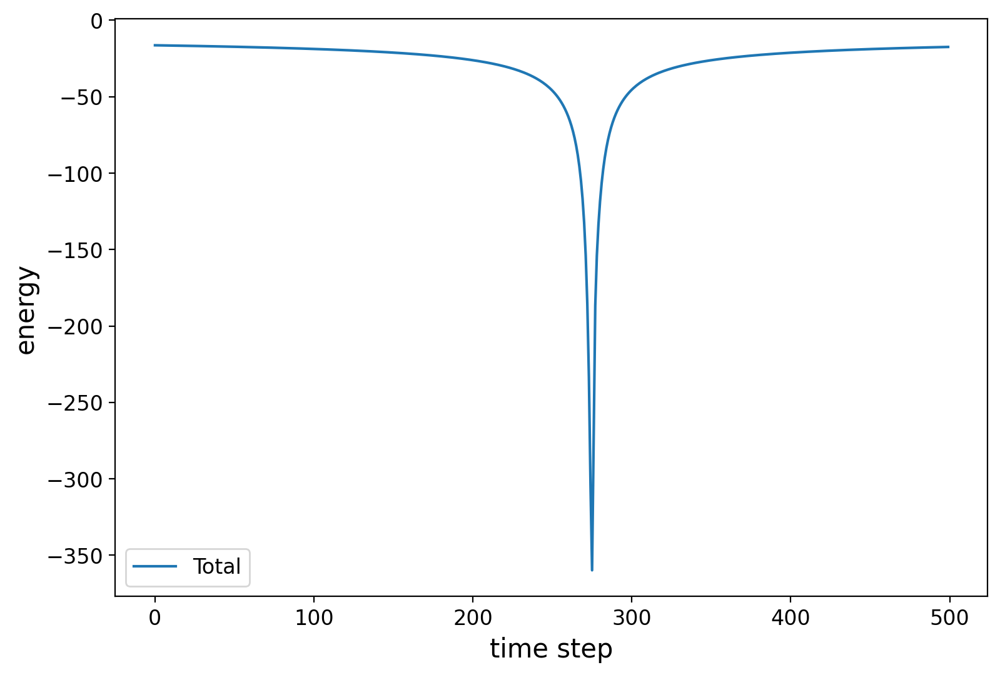

--- 0.5548830032348633 seconds ---
(44,)


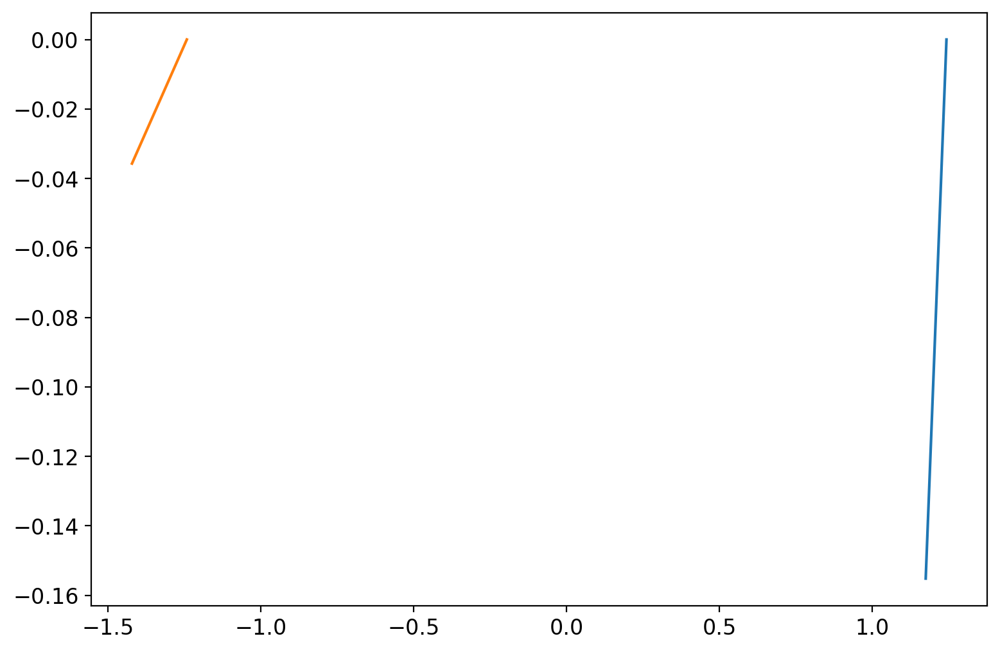

--- 0.2359302043914795 seconds ---


In [220]:
def prepInputs(iPos,iV,iM):
    dvec=iPos[0]-iPos[1]
    theta = -1.*np.arctan2(dvec[1],dvec[0])
    #theta = np.arctan2(dvec[1],dvec[0])
    rot = np.array([[np.cos(theta), -np.sin(theta)], [np.sin(theta), np.cos(theta)]])
    #rotate
    opos=np.reshape(np.zeros(4),(2,2))
    opos[0] = np.dot(rot, iPos[0])
    opos[1] = np.dot(rot, iPos[1])
    ovel=np.reshape(np.zeros(4),(2,2))
    ovel[0] = np.dot(rot, iV[0])
    ovel[1] = np.dot(rot, iV[1])
    #set y-coordinate to exactly 0
    #opos[0,1]=0
    #opos[1,1]=0
    merge=np.concatenate((iV.flatten(),opos.flatten(),iM.flatten()))
    lInput=torch.tensor(merge).float()
    return lInput


#def prepOutput(iPos,iInf):
#    theta = -1.*np.arctan2(iPos[:,1],iPos[:,0])
#    rot = np.array([[np.cos(theta), -np.sin(theta)], [np.sin(theta), np.cos(theta)]])
#    #rotate
#    lPos   = iInf
#    opos=np.reshape(np.zeros(4),(2,2))
#    opos[0] = np.dot(rot, lPos[0])
#    opos[1] = np.dot(rot, lPos[1])
#    return opos

#Now lets run a simulator for this 
def mlSim(pos,mass,v,iN=2,dt=0.001,nsteps=10,iPlot=False,iOutput=1):
    posh = np.array([])
    velh = np.array([])
    lPos = pos
    lV   = v
    posh   = np.append(posh,lPos)
    velh   = np.append(velh,lV)
    lInput = prepInputs(pos,v,mass)    
    for i0 in range(nsteps):
        output = model2(lInput)
        lPos   += output[0:4].reshape(2,2).detach().numpy()
        lV     += output[4:8].reshape(2,2).detach().numpy()
        posh   = np.append(posh,lPos)
        velh   = np.append(velh,lV)
        lInput = prepInputs(lPos,lV,mass)
    if iPlot:
        print(posh.shape)
        posh=np.reshape(posh,(nsteps+1,2*iN))
        for i0 in np.arange(iN):
            plt.plot(posh[:,2*i0],posh[:,2*i0+1])
        plt.show()

np.random.seed(50)
pos,mass,v=randomSamplePlanets(2)
import time
start_time = time.time()
#print(pos,mass,v)
sim(pos,mass,v,nsteps=500,iPlot=True)
print("--- %s seconds ---" % (time.time() - start_time))
start_time = time.time()
#print(pos,mass,v)
mlSim(pos,mass,v,iPlot=True,nsteps=10)
print("--- %s seconds ---" % (time.time() - start_time))


<a name='section_16_6'></a>
<hr style="height: 1px;">

## <h2 style="border:1px; border-style:solid; padding: 0.25em; color: #FFFFFF; background-color: #90409C">L16.6 1D Hydrodynamical Solutions </h2>  



Note: from here https://zingale.github.io/computational_astrophysics/ODEs/ODEs-conservation.html

Now that we have developed the concept of how to solve 1D differential equations. Moreover, we have even applied this to the notion of planetary interations. We would like to do consider a regular grid of objects, kind of like what we did with the tree above. However, now we are going to keep our objects fixed, and use the fact that they are fixed to try to solve a partial differential equation. 

First, lets imagine we have a box filled with water, and we discritzie this box to have various levels of water. 

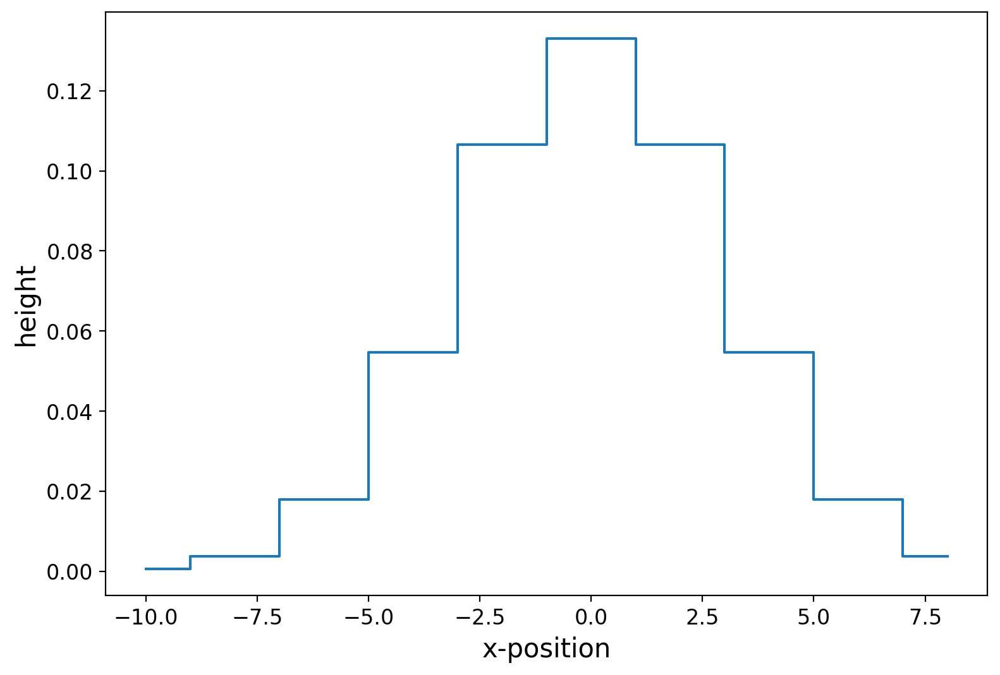

In [178]:
import scipy.stats as stats

ngrid=10
gridx=np.arange(-10,10,20/ngrid)
gridy=stats.norm.pdf(gridx,0,3)
plt.plot(gridx, gridy, drawstyle='steps-mid', label='steps-mid')
plt.xlabel('x-position')
plt.ylabel('height')
plt.show()

Now imagine for some crazy reason, that this a mountain of water describd by a discretized probability distribution function given by above, and this mountain is moving with some velocity $v$. The equation of motion for this moutain can be written as 

$$
\frac{\partial p}{\partial t} + v \frac{\partial p}{\partial x} = 0
$$

This is often called the 1D Euler equation or just the Burger's equation. The solution to this is the pdf $p(x,t)$ moves with a velocity of $v$ in this case its a normal distribution sliding to the right. Mathematically speaking, we just write this as: 

$$
p(x,t) = \mathcal{N} (\mu=x-vt,\sigma)\\
\frac{\partial p(x^{\prime} = x-vt)}{\partial x} = \frac{\partial p(x^{\prime} = x-vt)}{\partial x^{\prime}}  \\
\frac{\partial p(x^{\prime} = x-vt)}{\partial t} = -v\frac{\partial p(x^{\prime} = x-vt)}{\partial x^{\prime}}  \\
$$

We can also solve this numerically by noting that we can translate each element of our grid into motion characterized by its neighbour. The way we do this is tha for each bin ($b^{t+1}_{i}$) at time $t+1$ we modify it during time by its neighbours and its previous bin by noting the motion of the system will cause the current bin to lose a fraction of its elements with the fraction given by $C=\frac{\Delta x_{t+1-t}}{\Delta x_{\rm bin}}$ the amount of motion in a step over the bin size, which we can writing noting the velocity $v$ as 

$$
\frac{\partial f(x) }{\partial x} = \frac{f(x)-f(x-\Delta x)}{\Delta x}\\
\frac{\partial f(x) }{\partial x} = \frac{b^{t}_{i}-b^{t}_{i-1}}{\Delta x}\\
\frac{\partial f(x) }{\partial t} = \frac{b^{t+1}_{i}-b^{t}_{i}}{\Delta t}\\
b^{t+1}_{i} = b^{t}_{i} - \frac{v\Delta t}{\Delta x} b^{t}_{i} + \frac{v\Delta t}{\Delta x} b^{t}_{i-1}
$$

where the last term is the addition of stuff coming from the bin right next to it. As a side note, the term $C=\frac{\Delta x_{t+1-t}}{\Delta x_{\rm bin}}$ is called the Courant-Fredrichs-Lewy condition. 

Ok now lets evolve it, to make things easier, we are going to do this with video game geomtery, or if you jump on the right you will end up on the left. For this, we are going to use the roll command, lets quickly see how it works. 


In [177]:
array=np.arange(1,10,1)
print(array)
print(np.roll(array,1))

[1 2 3 4 5 6 7 8 9]
[9 1 2 3 4 5 6 7 8]


Our strategy will then be to shift our distribution by one unit, and then average the current distribution with the shifted distribution by the velocity. 

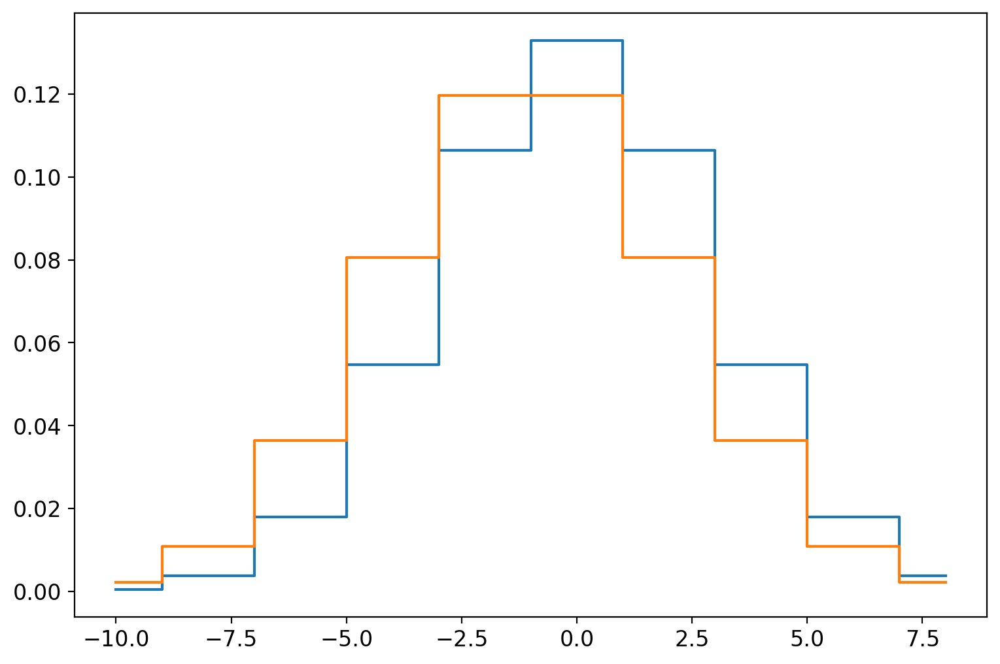

In [179]:
def evolvepdf(xvals,pdf,v,dt):
    C = v*dt/(xvals[1]-xvals[0])
    pdf = pdf*(1-C) + np.roll(pdf,-1)*C 
    #pdf = pdf + np.roll(pdf,-1)*C*0.5 - np.roll(pdf,1)*C*0.5 
    return pdf

#ok lets step it once and check
gridx=np.arange(-10,10,20/ngrid)
gridy=stats.norm.pdf(gridx,0,3)
plt.plot(gridx,gridy,drawstyle='steps-mid')
newgridy=gridy
for i0 in range(1):
    newgridy=evolvepdf(gridx,newgridy,1,1)
plt.plot(gridx,newgridy,drawstyle='steps-mid')
plt.show()

#now lets step it a few times and make a video
    


Now the interesting thing is to test this guy over time. What if we evolve a top hat distribution moving to the right 100 steps or even more? Ideally, our top-hat should be preserved, but this shifting is definitely not perfect. Lets go ahead and evolve our top hat 2000 steps over a distance of 20. This should just reproduce the original top hat distribution at the same position. What do you think will happen? 

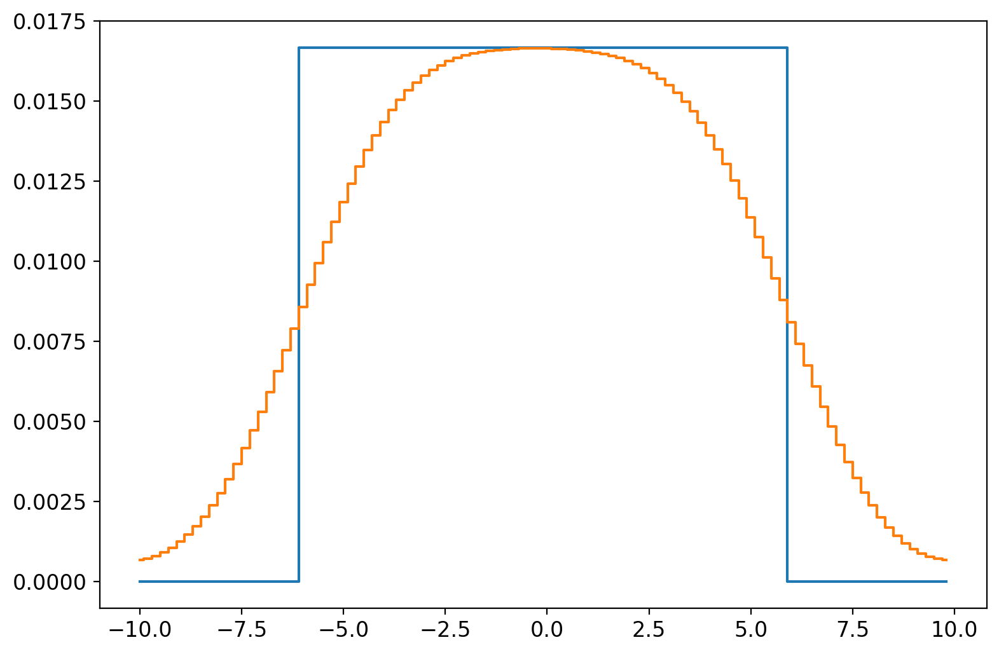

In [180]:
#now lets evolve a hat with 100 steps
ngrid=100
gridx=np.arange(-10,10,20/ngrid)
gridy=np.ones(gridx.shape)
gridy[0:20]=0
gridy[80:100]=0
#gridy=np.sin(gridx)**2
gridy*=1./np.sum(gridy) #normalize it

def evolve(igridx,igridy,idt,iv):
    plt.plot(igridx,igridy,drawstyle='steps-mid')
    niter=2000
    for i in range(niter):
        igridy=evolvepdf(igridx,igridy,iv,idt)
    plt.plot(igridx,igridy,drawstyle='steps-mid')
    return igridy
    
outy=evolve(gridx,gridy,0.1,0.1) #if we do 1000 iterations of 0.1 that is a distance of 100 or 10 times around


You can see that the top hat is starting to deflate over time. This deflation is a result of the inaccuracy of our sysem to evolve the fluid flow. It eventually starts to fall apart, this is the issue with numerical simulations that we have seen time and time again. Numerics are only so good without some physics intution. 


A quick way to understand why the convergence breaks down, we can imagine fourier transforming our tophat distribution. If we consider a single fourier mode our amplitude formula. Let's take our amplitude formula

$$
b^{t+1}_{i} = b^{t}_{i} - \frac{v\Delta t}{\Delta x} b^{t}_{i} + \frac{v\Delta t}{\Delta x} b^{t}_{i-1} \\
b^{t+1}_{i} = b^{t}_{i} - \frac{C}{2} \left( b^{t}_{i} -  b^{t}_{i-1} \right)
$$

Now isolating a single Fouier mode we have with $I=\sqrt{-1}$ to avoid complications in toation

$$
\tilde{b}^{t+1}_{i}e^{Ii\theta} = \tilde{b}^{t}e^{Ii\theta} - \frac{C}{2} \left(  \tilde{b}^{t}e^{I(i+1)\theta}  -  \tilde{b}^{t} e^{I(i-1)\theta}  \right) \\
\tilde{b}^{t+1}_{i} = \tilde{b}^{t}\left(1 - \frac{C}{2} \left(  e^{I\theta}  -   e^{I\theta}  \right)\right) \\
\tilde{b}^{t+1}_{i} = \tilde{b}^{t}\left(1 - C I\sin\theta\right)\\
$$ 

or in other words the change in the amplitude of this mode is given by 

$$
|\frac{\tilde{b}^{t+1}}{\tilde{b}^{t}}|^{2} = 1+C^2\sin^{2}\theta
$$

This means that as long as we continue to iterate over and over again, we will always smear things out (adding mroe and more fouier modes). Eventually we will just end up with something flat. 

Lets now try construct something that is a little more robust. Lets consider our distribution is an approximation of a a continuous distribution $f(x)$. We can thus make a computation of the derivative of the pdf by noting that in a histogram the best esitmate of the pdf is from the center of the bin. This gives us

$$
\frac{df}{dx} = \frac{f(x+\frac{\Delta x}{2})-f(x-\frac{\Delta x}{2})}{\Delta x}
$$

As a result, we can then write

$$
f(x,t+\Delta t) = f(x) + \frac{\Delta x}{\Delta t} \Delta t  \frac{df}{dx}
$$

and a better approximation becomes 

$$
f(x,t+\Delta t) = f(x) + \frac{\Delta x}{\Delta t} \Delta t  \frac{df}{dx}(t+\frac{\Delta t}{2})
$$


59.99999999999995 59.99999999999995


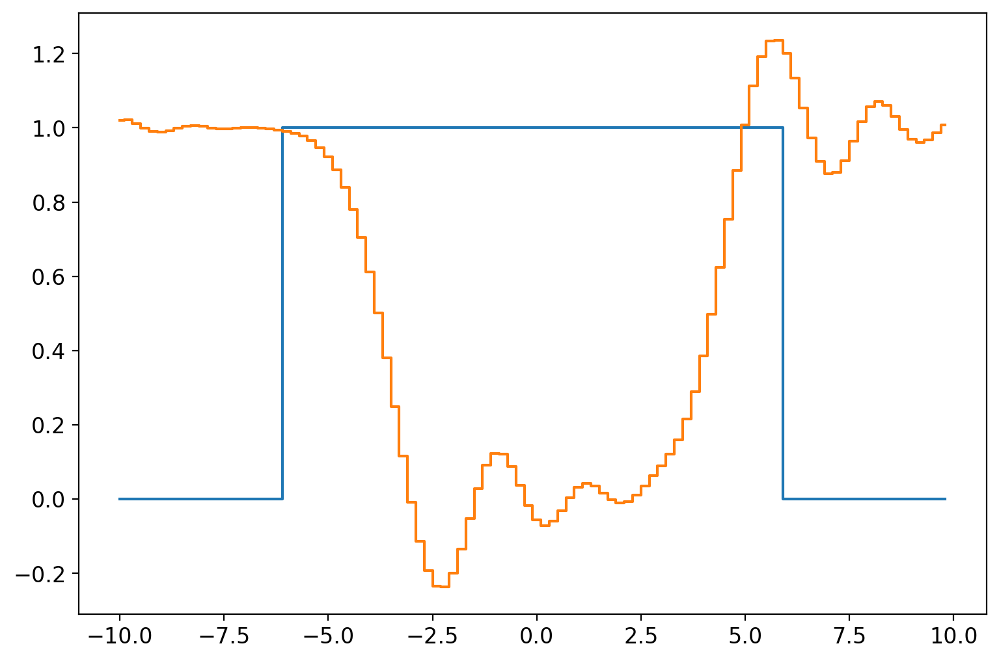

In [973]:
def dpdfdx(xvals,pdf):
    dx=(xvals[1]-xvals[0])
    dpdfdx     = 0.5*(np.roll(pdf,2)-pdf)#df/dx (dx=bin)
    pdfshift = pdf    + 0.5*dpdfdx#f(x+dx/2) => shift by 1/2 a bin
    #nwo the diervaitve
    return (np.roll(pdfshift,-1)-pdfshift)/dx #df(x+dx/2)/dx

def evolvepdf(xvals,pdf,v,dt):
    C = v*dt
    dpdf     = dpdfdx(xvals,pdf)
    pdf2     = pdf + 0.5*C*dpdf #f(x,t+dt/2)
    dpdf     = dpdfdx(xvals,pdf2)  #dff(x,t+dt/2)/dx
    pdf      += C*dpdf #shift it
    return pdf


def evolve(igridx,igridy,idt,iv):
    plt.plot(igridx,igridy,drawstyle='steps-mid')
    niter=2000
    for i in range(niter):
        igridy=evolvepdf(igridx,igridy,iv,idt)
    plt.plot(igridx,igridy,drawstyle='steps-mid')
    return igridy

#now lets evolve a hat with 100 steps
ngrid=100
gridx=np.arange(-10,10,20/ngrid)
gridy=np.ones(gridx.shape)
gridy[0:20]=0
gridy[80:100]=0
#gridy=np.sin(gridx)**2
outy=evolve(gridx,gridy,0.1,0.05)
print(np.sum(gridy),np.sum(outy))


Now, we can do even better than this by improving our approximations This is very much like what we did with the leapfrog method and the Runge-kutta methods. Here what we are doing is improving our estimation of the derivative. We can do this by 

$$
\frac{df}{dx} = \min\left(\frac{f(x)-f(x-\Delta x)}{\Delta x} , \frac{f(x+\Delta x)-f(x)}{\Delta x}\right) \\
$$

Now noting that derivate if there is a minima in a bin ie 


$$
\frac{f(x)-f(x-\Delta x)}{\Delta x} \times \frac{f(x+\Delta x)-f(x)}{\Delta x} < 0
$$

we take a slope of zero. From there we can then go ahead and compute

$$
\frac{df}{dx}(x+\frac{\Delta x}{2}) 
$$

using the above distribution. 

59.99999999999997 59.99999999999997


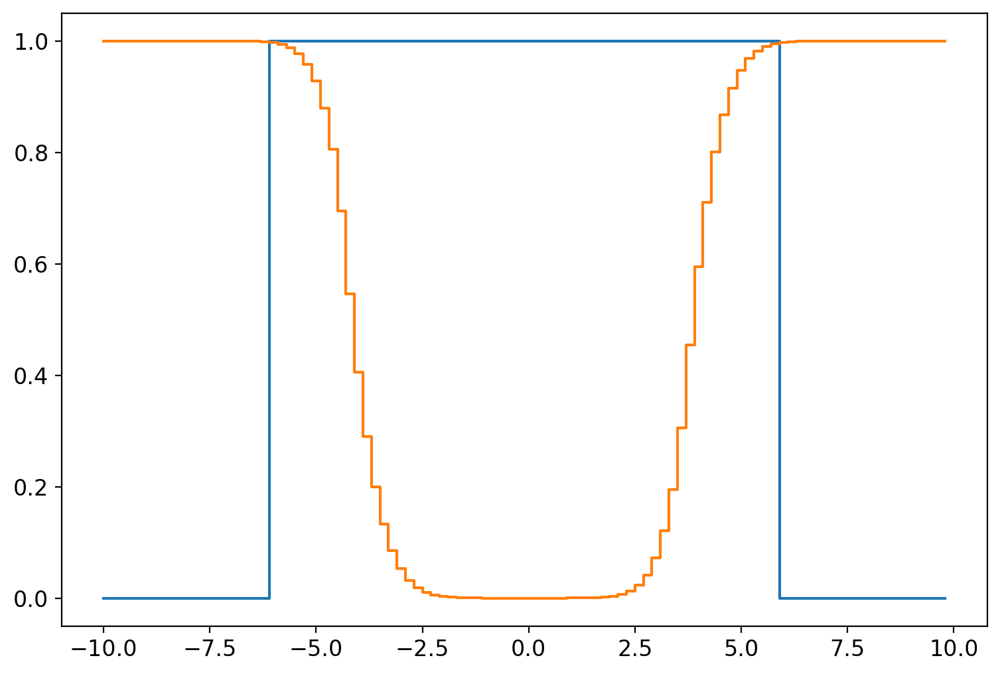

In [977]:
def dpdfdx(xvals,pdf):
    dx=(xvals[1]-xvals[0])
    dpdfu     = (np.roll(pdf,1)-pdf)#b_[i+1]-b_{i}
    dpdfd     = (pdf-np.roll(pdf,-1))#b_[i]-b_{i-1}
    dpdfmin   = np.where(np.fabs(dpdfd) < np.fabs(dpdfu), dpdfd, dpdfu) #min diff
    dpdfmin   = np.where(dpdfd*dpdfu > 0, dpdfmin, 0) #min diff
    pdfshift  = pdf    + 0.5*dpdfmin#shift by 1/2 a bin
    return (np.roll(pdfshift,-1)-pdfshift)/dx #This ensures integral is conserved

def evolvepdf(xvals,pdf,v,dt):
    C = v*dt
    dpdf     = dpdfdx(xvals,pdf)
    pdf2     = pdf + 0.5*C*dpdf #shift it half
    dpdf     = dpdfdx(xvals,pdf2)  #dff(x,t+dt/2)/dx
    pdf      += C*dpdf #shift it
    return pdf

def evolve(igridx,igridy,idt,iv):
    plt.plot(igridx,igridy,drawstyle='steps-mid')
    niter=2000
    for i in range(niter):
        igridy=evolvepdf(igridx,igridy,iv,idt)
    plt.plot(igridx,igridy,drawstyle='steps-mid')
    return igridy

#now lets evolve a hat with 100 steps
ngrid=100
gridx=np.arange(-10,10,20/ngrid)
gridy=np.ones(gridx.shape)
gridy[0:20]=0
gridy[80:100]=0
#gridy=np.sin(gridx)**2
outy=evolve(gridx,gridy,0.1,0.05)
print(np.sum(gridy),np.sum(outy))

ok now lets actually do the inviscit Berger's equation  ( https://en.wikipedia.org/wiki/Burgers%27_equation) 

$$
\frac{\partial v}{\partial t} - v \frac{\partial v}{\partial x} = 0 \\
\frac{\partial v}{\partial t} - \frac{1}{2} \frac{\partial v^{2}}{\partial x}=0
$$

This shows the diffusion flow a system. The difference with above is that the $v$ is now the funciton we want to solve. 

Instead of a pdf, we are now solving for $v(x,t)$. 

The way we are going to do this is we now need to compute 

$$
\frac{\partial u}{\partial x}  = \min\left(\frac{u(x)-u(x-\Delta x)}{\Delta x} , \frac{u(x+\Delta x)-u(x)}{\Delta x}\right)
$$

Then what we do is approximate is the velocity going out of the bin, and the velocity of the fluid going into the bin

$$
u_{l} = u(x-\frac{\Delta x}{2})\\
u_{r} = u(x+\frac{\Delta x}{2})
$$

If we have $u_{r} > u_{l}\rightarrow u_{r} + u_{l} > 0$  then we have that fluid is leaving the bin. However if its less than 0, then we have that fluid is piling up.  At this stage 


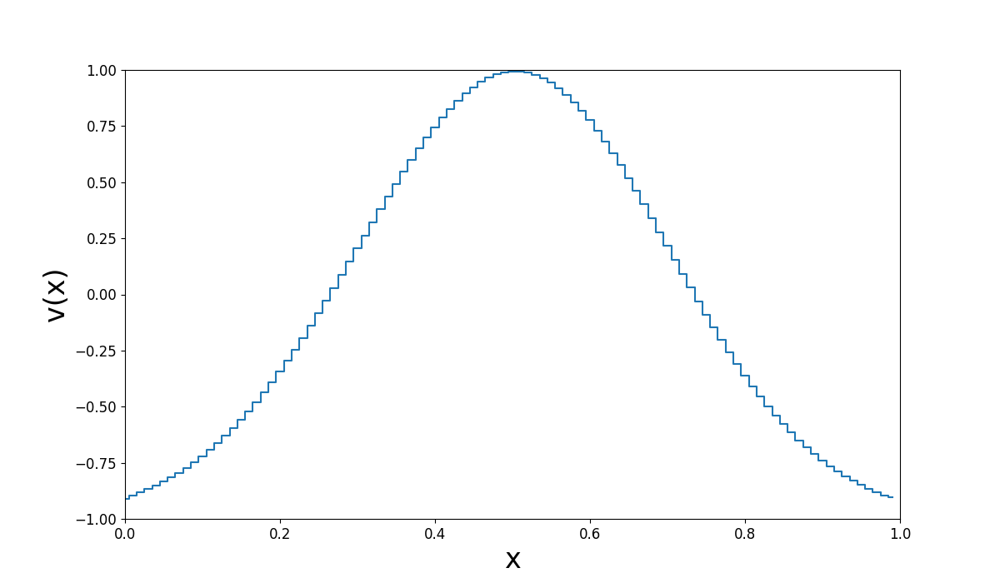

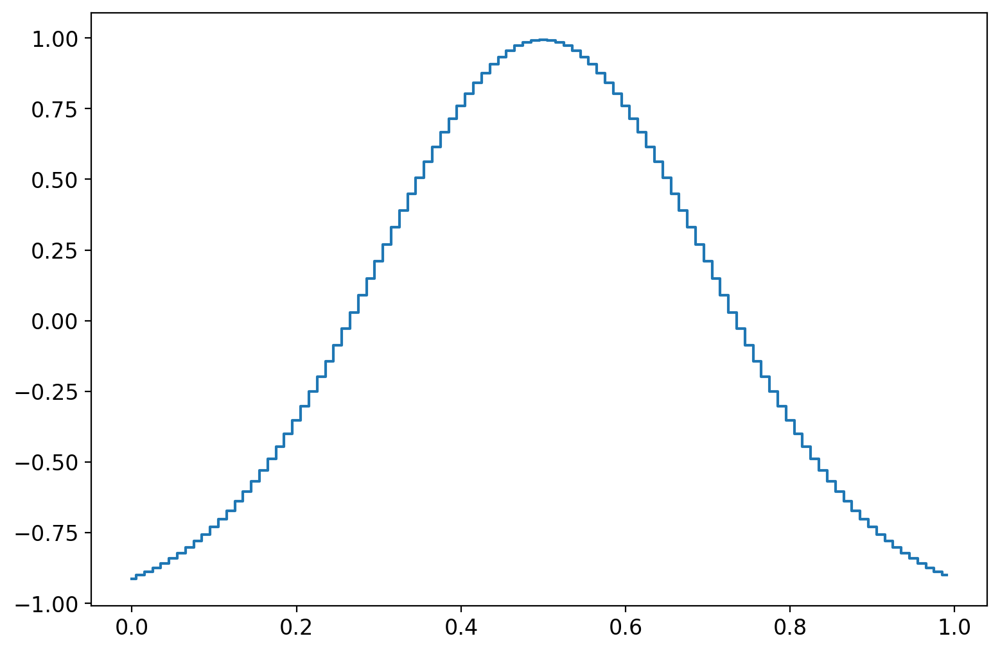

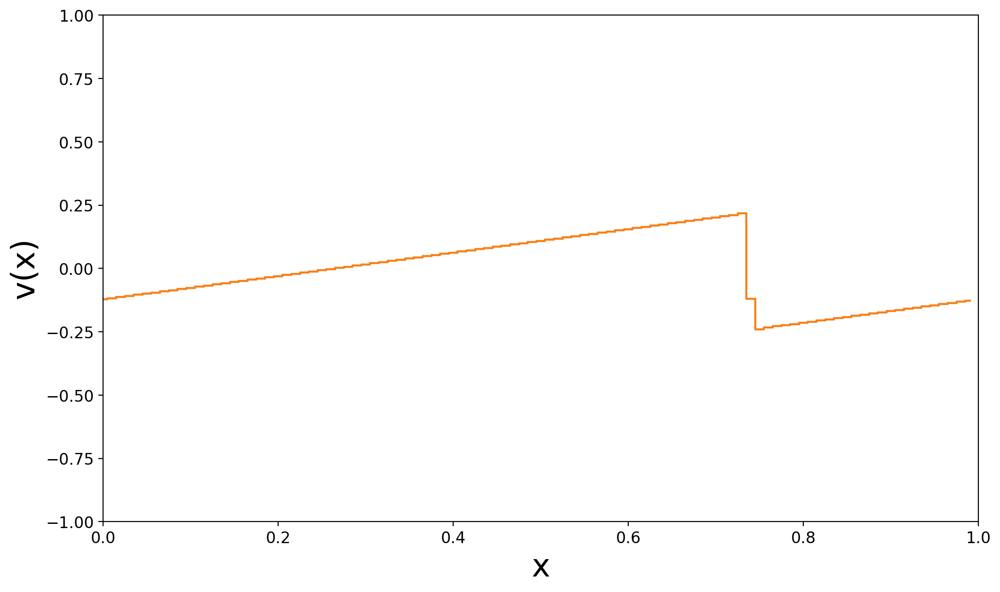

In [240]:
def dpdfdx(xvals,pdf,shock=False):
    dx=(xvals[1]-xvals[0])
    #compute
    dpdfr     = (np.roll(pdf,-1)-pdf)#b_[i+1]-b_{i}
    dpdfl     = (pdf-np.roll(pdf,1))#b_[i]-b_{i-1}
    dpdfmin   = np.where(np.fabs(dpdfl) < np.fabs(dpdfr), dpdfl, dpdfr) #min diff
    dpdfmin   = np.where(dpdfr*dpdfl > 0, dpdfmin, 0) #if sign change take zero
    #Now compute the difference
    pdfshiftl = pdf    - 0.5*dpdfmin#f(x-dX/2)
    pdfshiftr = np.roll(pdf,1)    + 0.5*np.roll(dpdfmin,1)#f(x+dx/2) => note shift to match the two
    
    #shock wave
    S = 0.5 * (pdfshiftr + pdfshiftl)#aggregate velocity  
    ushock = np.where(S   > 0.0, pdfshiftr, pdfshiftl) #computate aggregate velocity take ther right direction given
    ushock = np.where(S  == 0.0, 0.0, ushock) #Check its not zero

    #normal wave
    urare  = np.where(pdfshiftl <= 0.0, pdfshiftl, 0.0) #if right vel < 0 keep it
    urare  = np.where(pdfshiftr >= 0.0, pdfshiftr, urare) #if left vel > 0 keep that over previous
    if shock:
        us     = np.where(pdfshiftr > pdfshiftl, ushock, urare) #if right is greater than left (compression) do shock
    else:
        us     = urare
    #now shift the bin
    return (np.roll(us,0)**2 - np.roll(us,-1)**2)/dx

def evolvepdf(xvals,pdf,dtstep,shock=False):
    eps=0.1
    dx=(xvals[1]-xvals[0])
    dt = dtstep*dx/(np.max(np.abs(pdf))+eps)
    C = 0.5*dt
    dpdf     =  dpdfdx(xvals,pdf,shock)
    pdf2     =  pdf + 0.5*C*dpdf #shift it half
    dpdf     =  dpdfdx(xvals,pdf2,shock) #compute exptected shift
    pdf      += C*dpdf #shift it
    return pdf,dt


def makePlot(ixvals,iyvals,ax,fig,images,ymin=-1,ymax=1,xmin=0,xmax=1.0):
    # plot and show learning process
    plt.cla()
    ax.set_xlabel('x', fontsize=24)
    ax.set_ylabel('v(x)', fontsize=24)
    ax.set_ylim(ymin,ymax)
    ax.set_xlim(xmin,xmax)
    ax.plot(ixvals,iyvals,drawstyle='steps-mid')
    fig.canvas.draw()       # draw the canvas, cache the renderer
    image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
    image  = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))
    images.append(image)


def evolve(images,igridx,igridy,idt,shock=False):
    plt.plot(igridx,igridy,drawstyle='steps-mid')
    niter=250
    time=0
    fig, ax = plt.subplots(figsize=(12,7))
    for i in range(niter):
        igridy,pdt=evolvepdf(igridx,igridy,idt,shock=shock)
        time+=pdt
        makePlot(igridx,igridy,ax,fig,images)
    plt.plot(igridx,igridy,drawstyle='steps-mid')
    return igridy

#now lets evolve a hat with 100 steps
ngrid=100
gridx=np.arange(0,1,1/ngrid)
gridybase=np.zeros(gridx.shape)
def sine(igridx,igridy):
    index = np.logical_and(igridx >= 0.333,igridx <= 0.666)
    igridy[index] += gridx[index]*(1.5*np.sin(2.0*np.pi*(igridx[index]-0.333)/0.333))
    return igridy
gridy=sine(gridx,gridybase)

gridy=stats.norm.pdf(gridx,0.5,0.2)-1
#gridy[0:10]=0
#gridy[90:100]=0

#gridy=np.ones(gridx.shape)*0.8
#gridy[0:10]=0
#gridy[90:100]=0

images=[]
outy=evolve(images,gridx,gridy,0.5,shock=True)

from IPython.display import Image
imageio.mimsave('./berger.gif', images, fps=10)
Image(open('berger.gif','rb').read())


#gridybase=np.zeros(gridx.shape)
#gridy=sine(gridx,gridybase)
#outy=evolve(gridx,gridy,0.5,shock=False)
#plt.show()

### <span style="border:3px; border-style:solid; padding: 0.15em; border-color: #90409C; color: #90409C;">Ex-16.1.1 </span>

Repeat the top hat evolution with 1/10th the time step, how much does this lead to the diulation? 




In [ ]:

(Question for later, how does the time step and velocity impact our precisiion? )
Q: What happens for a sine wave? 


<a name='section_16_7'></a>
<hr style="height: 1px;">

## <h2 style="border:1px; border-style:solid; padding: 0.25em; color: #FFFFFF; background-color: #90409C">L16.7 N-D Hydrodynamical Solutions </h2>  


A multi-dimensional version of the above equations starts from the Euler equation. We can write the Euler equation for conservation of mass 

$$
\frac{\partial \rho}{\partial t} + \nabla\cdot (\rho \vec{u}) = 0
$$

Next, we can write the Euler equation for conservation of momentum as

$$
\frac{\partial \rho \vec{u} }{\partial t} + \nabla\cdot (\rho \vec{u} \otimes \vec{u} + \vec{P} ) = -\rho\nabla\Phi
$$

where the term on the right is just the external force. 

Finally, we can write the Euler equation for conservation of Energy as

$$
\frac{\partial \rho E }{\partial t} + \nabla\cdot (\rho E \vec{u} + p\vec{u} ) = 0
$$

Often they are written in vector form 

$$
\frac{\partial q_{i}}{\partial t} + \frac{\partial f}{\partial q_{i}} = 0
$$

where we have 

$$
f 
$$

For $f$ one the of the functions above. The above set of equations, thus constitutes a set of coupled differential equations that we need to solve, and are in all practial purposes a generalization of the equations above. In light of this we are going to do something more complicated. 

Let's take our middle equation, and rewrite it slightly in a simpler form. We can write this as

$$
\frac{d\vec{v}}{dt} = -\frac{1}{\rho}\nabla \vec{P} - \frac{1}{\rho}\vec{f}
$$

If we consider a spherically symetric setup, then we can write the pressure $P(r)=k\rho^{1+1/n}$ essentially, we are just saying it scales with $\rho$. Additionally, we can write the force $f(r)=-\lambda r - \nu v$ in terms of the gravitational pressurem $\lambda$ and the viscosity $\nu$

Furthermore, if we treat each point a spherically symmetric Gaussian, we can write

$$
\rho_{i}(r) = \left(\frac{1}{\sigma\sqrt{\pi}}\right)^{3} e^{-\frac{r_{i}^2}{\sigma^2}}
$$

The density at a specific point can then just given by the sum over all particles at that point

$$
\rho(\vec{r}) =  \sum_{i} m_{i} \rho_{i}\left(\vec{r}-\vec{r_{i}}\right)
$$
More over, with this discretiation, we can write
$$
\nabla \rho(\vec{r}) =  \sum_{i} m_{i} \nabla \rho_{i}\left(\vec{r}-\vec{r_{i}}\right)
$$

We can also write 
$$
\frac{1}{\rho}\nabla P = \nabla\left(\frac{P}{\rho}\right)+\frac{P}{\rho^2}\nabla\rho
$$

Noting 
$$
\frac{P}{\rho}(\vec{r_{i}}) = \sum_{j} \frac{P_{j}}{\rho^{2}_{j}} m_{j} \rho_{j} \left(\vec{r_{i}}-\vec{r_{j}}\right)\\
\nabla\left(\frac{P_{i}}{\rho}\right) = \sum_{j} \frac{P_{j}}{\rho^{2}_{j}} m_{j} \nabla \rho_{j} \left(\vec{r_{i}}-\vec{r_{j}}\right)
$$

Now combining this we have
$$
\frac{1}{\rho}\nabla P = \sum_{j\neq i} \left(\frac{P_{i}}{\rho^{2}_{i}} + \frac{P_{j}}{\rho^{2}_{j}}\right)\nabla \rho_{j} \left(\vec{r_{i}}-\vec{r_{j}}\right)
$$

The resulting acceleration is thus

$$
\frac{d\vec{v}}{dt} = -\sum_{j\neq i} \left(\frac{P_{i}}{\rho^{2}_{i}} + \frac{P_{j}}{\rho^{2}_{j}}\right)\nabla \rho_{j} \left(\vec{r_{i}}-\vec{r_{j}}\right) + \vec{f}
$$


More details here
http://www.astro.yale.edu/vdbosch/Numerical_Hydrodynamics.pdf
https://philip-mocz.medium.com/create-your-own-smoothed-particle-hydrodynamics-simulation-with-python-76e1cec505f1

/var/folders/4t/mwl83f3x1ls0jvy35v4qzj7c0000gp/T/ipykernel_68985/346110203.py:129: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot(grid[0:2,0])


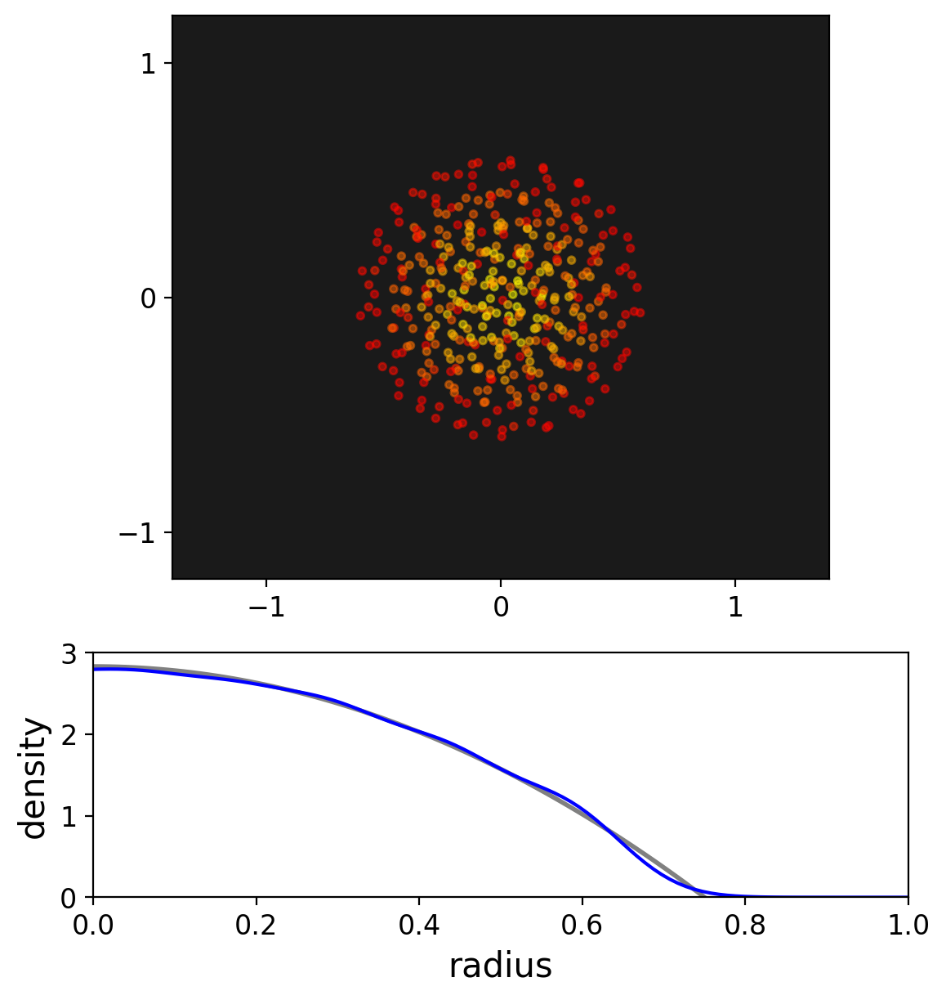

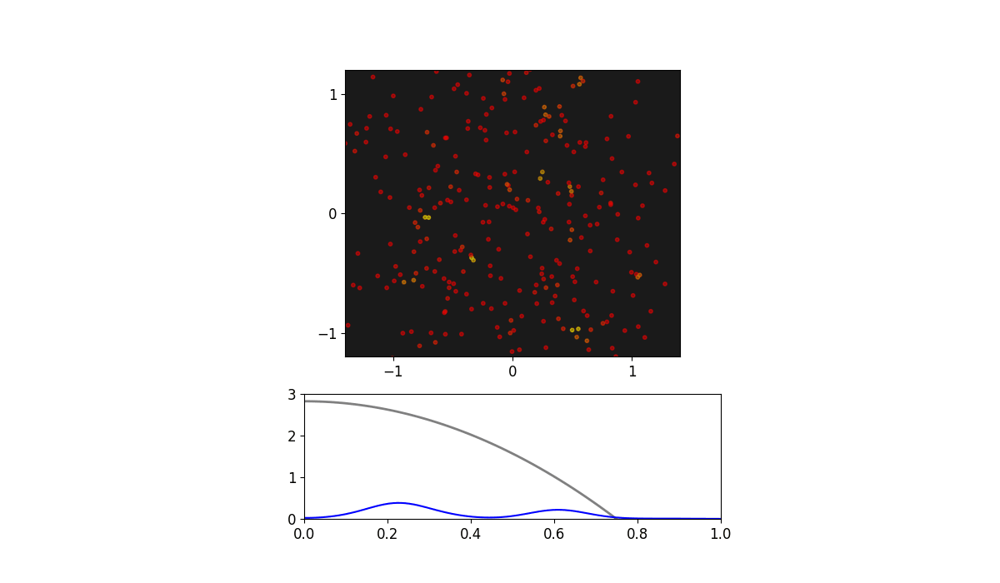

In [1051]:
from scipy.special import gamma

def rhoP( x, y, z, h ):
    r = np.sqrt(x**2 + y**2 + z**2)  
    w = (1.0 / (h*np.sqrt(np.pi)))**3 * np.exp( -r**2 / h**2)
    return w

def gradrhoP( x, y, z, h ):
    r = np.sqrt(x**2 + y**2 + z**2)
    n = -2 * np.exp( -r**2 / h**2) / h**5 / (np.pi)**(3/2)
    wx = n * x
    wy = n * y
    wz = n * z
    return wx, wy, wz

def getPairwiseSeparations( ri, rj ):
    M = ri.shape[0]
    N = rj.shape[0]
  
    # positions ri = (x,y,z)
    rix = ri[:,0].reshape((M,1))
    riy = ri[:,1].reshape((M,1))
    riz = ri[:,2].reshape((M,1))
  
    # other set of points positions rj = (x,y,z)
    rjx = rj[:,0].reshape((N,1))
    rjy = rj[:,1].reshape((N,1))
    rjz = rj[:,2].reshape((N,1))
  
    # matrices that store all pairwise particle separations: r_i - r_j
    dx = rix - rjx.T
    dy = riy - rjy.T
    dz = riz - rjz.T
    
    return dx, dy, dz

def getDensity( r, pos, m, h ):
    M = r.shape[0]
    dx, dy, dz = getPairwiseSeparations( r, pos );
    rho = np.sum( m * rhoP(dx, dy, dz, h), 1 ).reshape((M,1))
    return rho

def getPressure(rho, k, n):
    P = k * rho**(1+1/n)
    return P

def getAcc( pos, vel, m, h, k, n, lmbda, nu ):
    N = pos.shape[0]
    rho = getDensity( pos, pos, m, h )
  
    # Get the pressures
    P = getPressure(rho, k, n)
  
    # Get pairwise distances and gradients
    dx, dy, dz = getPairwiseSeparations( pos, pos )
    dWx, dWy, dWz = gradrhoP( dx, dy, dz, h )
  
    # Add Pressure contribution to accelerations   
    tmp1 = P/rho**2 
    tmp2 =  P.T/rho.T**2 
    tmp  = ( P/rho**2 + P.T/rho.T**2  )
    ax = - np.sum( m * ( P/rho**2 + P.T/rho.T**2  ) * dWx, 1).reshape((N,1))
    ay = - np.sum( m * ( P/rho**2 + P.T/rho.T**2  ) * dWy, 1).reshape((N,1))
    az = - np.sum( m * ( P/rho**2 + P.T/rho.T**2  ) * dWz, 1).reshape((N,1))
  
    # pack together the acceleration components
    a = np.hstack((ax,ay,az))
  
    # Add external potential force and viscosity
    a += -lmbda * pos - nu * vel
  
    return a

def makePlot(pos,ax1,ax2,fig,rho,images,rr,rlin,rho_analytic, m, h):
    plt.sca(ax1)
    plt.cla()
    cval = np.minimum((rho-3)/3,1).flatten()
    ax1.scatter(pos[:,0],pos[:,1], c=cval, cmap=plt.cm.autumn, s=10, alpha=0.5)
    ax1.set(xlim=(-1.4, 1.4), ylim=(-1.2, 1.2))
    ax1.set_aspect('equal', 'box')
    ax1.set_xticks([-1,0,1])
    ax1.set_yticks([-1,0,1])
    ax1.set_facecolor('black')
    ax1.set_facecolor((.1,.1,.1))

    plt.sca(ax2)
    plt.cla()
    ax2.set(xlim=(0, 1), ylim=(0, 3))
    ax2.set_aspect(0.1)
    ax2.plot(rlin, rho_analytic, color='gray', linewidth=2)
    rho_radial = getDensity( rr, pos, m, h )
    ax2.plot(rlin, rho_radial, color='blue')
    
    fig.canvas.draw()       # draw the canvas, cache the renderer
    image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
    image  = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))
    images.append(image)
            
def main(plotRealTime = True ):
    # Simulation parameters
    N         = 400    # Number of particles
    t         = 0      # current time of the simulation
    tEnd      = 12     # time at which simulation ends
    dt        = 0.04   # timestep
    M         = 2      # star mass
    R         = 0.75   # star radius
    h         = 0.1    # smoothing length
    k         = 0.1    # equation of state constant
    n         = 1      # polytropic index
    nu        = 1      # damping
    
    # Generate Initial Conditions
    np.random.seed(42)            # set the random number generator seed
    
    lmbda = 2*k*(1+n)*np.pi**(-3/(2*n)) * (M*gamma(5/2+n)/R**3/gamma(1+n))**(1/n) / R**2  # ~ 2.01
    m     = M/N                    # single particle mass
    pos   = np.random.randn(N,3)   # randomly selected positions and velocities
    vel   = np.zeros(pos.shape)

    # calculate initial gravitational accelerations
    acc = getAcc( pos, vel, m, h, k, n, lmbda, nu )

    # number of timesteps
    Nt = int(np.ceil(tEnd/dt))

    # prep figure
    fig, ax1 = plt.subplots(figsize=(12,7)) 
    grid = plt.GridSpec(3, 1, wspace=0.0, hspace=0.3)
    ax1 = plt.subplot(grid[0:2,0])
    ax2 = plt.subplot(grid[2,0])
    rr = np.zeros((100,3))
    rlin = np.linspace(0,1,100)
    rr[:,0] =rlin
    rho_analytic = lmbda/(4*k) * (R**2 - rlin**2)
    images=[]

    # Simulation Main Loop
    for i in range(Nt):
        vel += acc * dt/2
        pos += vel * dt
        # update accelerations
        acc = getAcc( pos, vel, m, h, k, n, lmbda, nu )
        vel += acc * dt/2
        # update timef
        t += dt
        # get density for plottiny
        rho = getDensity( pos, pos, m, h )

        # plot in real time
        if plotRealTime or (i == Nt-1):
            makePlot(pos,ax1,ax2,fig, rho, images,rr,rlin,rho_analytic,m,h)

    # add labels/legend
    plt.sca(ax2)
    plt.xlabel('radius')
    plt.ylabel('density')
    
    # Save figure
    plt.savefig('sph.png',dpi=240)
    plt.show()
    return images

images=main()
imageio.mimsave('./xstar.gif', images, fps=10)
Image(open('xstar.gif','rb').read())


In [1029]:
Image(open('star.gif','rb').read())